# Import Libraries

In [1]:
!pip install slidingwindow

In [2]:
import pandas as pd

In [3]:
import slidingwindow as sw
import numpy as np
import os
import keras.backend as K
import keras
from keras.models import Sequential
from keras import layers
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from scipy.ndimage import zoom
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import EfficientNetB0, Xception, NASNetMobile
from tensorflow.keras.applications import ResNet50, InceptionV3, MobileNetV2
from tensorflow.keras import layers, Sequential, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Prepare Dataset

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!cp -r /content/drive/MyDrive/Data/action_dataset /content/

In [7]:
%cd /content/action_dataset/

/content/action_dataset


In [8]:
!ls hijau

 hijau10.png   hijau5.png	     'Salinan hijau1.png'   'Salinan hijau29.png'
 hijau11.png   hijau6.png	     'Salinan hijau20.png'  'Salinan hijau2.png'
 hijau12.png   hijau7.png	     'Salinan hijau21.png'  'Salinan hijau30.png'
 hijau13.png   hijau8.png	     'Salinan hijau22.png'  'Salinan hijau3.png'
 hijau14.png   hijau9.png	     'Salinan hijau23.png'  'Salinan hijau4.png'
 hijau15.png  'Salinan hijau10.png'  'Salinan hijau24.png'  'Salinan hijau5.png'
 hijau1.png   'Salinan hijau16.png'  'Salinan hijau25.png'  'Salinan hijau6.png'
 hijau2.png   'Salinan hijau17.png'  'Salinan hijau26.png'  'Salinan hijau7.png'
 hijau3.png   'Salinan hijau18.png'  'Salinan hijau27.png'  'Salinan hijau8.png'
 hijau4.png   'Salinan hijau19.png'  'Salinan hijau28.png'  'Salinan hijau9.png'


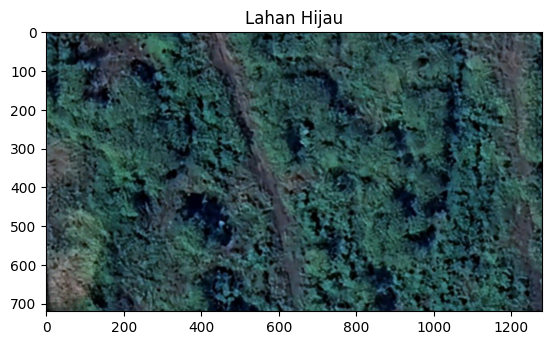

In [9]:
plt.title("Lahan Hijau")
plt.imshow(imread("hijau/hijau1.png"))
plt.show()

In [10]:
!ls bukan_hijau

 bukan_hijau10.png   bukan_hijau9.png		     'Salinan bukan_hijau22.jpg'
 bukan_hijau11.png  'Salinan bukan_hijau10.png'      'Salinan bukan_hijau23.jpg'
 bukan_hijau12.png  'Salinan bukan_hijau11.png'      'Salinan bukan_hijau24.jpg'
 bukan_hijau13.png  'Salinan bukan_hijau13 (1).png'  'Salinan bukan_hijau25.jpg'
 bukan_hijau14.png  'Salinan bukan_hijau13.png'      'Salinan bukan_hijau2.png'
 bukan_hijau15.png  'Salinan bukan_hijau14.png'      'Salinan bukan_hijau3.png'
 bukan_hijau1.png   'Salinan bukan_hijau15.png'      'Salinan bukan_hijau4.png'
 bukan_hijau2.png   'Salinan bukan_hijau16.jpg'      'Salinan bukan_hijau5.png'
 bukan_hijau3.png   'Salinan bukan_hijau17.jpg'      'Salinan bukan_hijau6.png'
 bukan_hijau4.png   'Salinan bukan_hijau18.jpg'      'Salinan bukan_hijau7.png'
 bukan_hijau5.png   'Salinan bukan_hijau19.jpg'      'Salinan bukan_hijau8.png'
 bukan_hijau6.png   'Salinan bukan_hijau1.png'	     'Salinan bukan_hijau9.png'
 bukan_hijau7.png   'Salinan bukan_hijau20.jpg

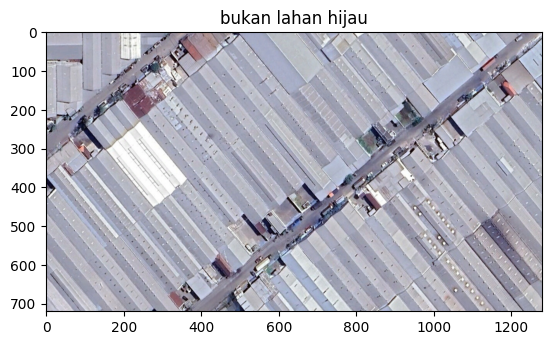

In [11]:
plt.title("bukan lahan hijau")
plt.imshow(imread("bukan_hijau/Salinan bukan_hijau9.png"))
plt.show()


# Image Preprocessing

## Create Image Directory

In [12]:
!rm -rf /content/action_dataset/bukan_hijau_chopped

In [13]:
!rm -rf /content/action_dataset/hijau_chopped

## Create Image Patches With sliding window

In [14]:
import os
import numpy as np
from skimage.io import imread, imsave
from keras.preprocessing.image import load_img, img_to_array
import slidingwindow as sw

def save_to_folder(img_path, directory, size=128, overlap=0.4):
    # Read image from path and save windows to the specified directory
    img = imread(img_path)
    if img.shape[2] == 4:
        # If image has 4 channels (RGBA), convert to RGB by discarding the alpha channel
        img = img[:, :, :3]
        print(f"Converted {img_path} from RGBA to RGB")  # Debugging

    basename = os.path.basename(img_path)
    fname = os.path.splitext(basename)[0]
    windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, size, overlap)

    print(f"Processing {basename}, found {len(windows)} windows")  # Debugging

    for i, window in enumerate(windows):
        _img = img[window.indices()]

        # Check the shape of the window
        print(f"Window {i} shape: {_img.shape}")  # Debugging

        if _img.shape != (size, size, 3):
            print(f"Skipping window {i} due to shape mismatch")  # Debugging
            continue

        ii = str("{0:05d}".format(i))
        _fname = fname + "_" + ii + ".png"
        img_target_path = os.path.join(directory, _fname)

        print(f"Saving window {i} to {img_target_path}")  # Debugging
        imsave(img_target_path, _img)

# Directories for bamboo and non-bamboo images
hijau_dir = "hijau"
bukan_hijau_dir = "bukan_hijau"

# Create directories for chopped images
os.makedirs("hijau_chopped", exist_ok=True)
os.makedirs("bukan_hijau_chopped", exist_ok=True)

# Processing images
x = []
y = []

# Loop through bamboo images
for file in os.listdir(hijau_dir):
    if file.endswith(".png"):
        label = 1  # bamboo images
        img_path = os.path.join(hijau_dir, file)
        chopped_dir = "hijau_chopped"  # save to hijau_chopped folder
        save_to_folder(img_path, chopped_dir)

        img = load_img(img_path, target_size=(128, 128))
        img = img_to_array(img) / 255.0
        x.append(img)
        y.append(label)

# Loop through non-bamboo images
for file in os.listdir(bukan_hijau_dir):
    if file.endswith(".png"):
        label = 0  # non-bamboo images
        img_path = os.path.join(bukan_hijau_dir, file)
        chopped_dir = "bukan_hijau_chopped"  # save to bukan_hijau_chopped folder
        save_to_folder(img_path, chopped_dir)

        img = load_img(img_path, target_size=(128, 128))
        img = img_to_array(img) / 255.0
        x.append(img)
        y.append(label)

# Convert lists to numpy arrays
x = np.array(x)
x = x.reshape(x.shape[0], -1)  # flatten the images
y = np.array(y)

print(x.shape, y.shape)


Converted hijau/hijau11.png from RGBA to RGB
Processing hijau11.png, found 144 windows
Window 0 shape: (128, 128, 3)
Saving window 0 to hijau_chopped/hijau11_00000.png
Window 1 shape: (128, 128, 3)
Saving window 1 to hijau_chopped/hijau11_00001.png
Window 2 shape: (128, 128, 3)
Saving window 2 to hijau_chopped/hijau11_00002.png
Window 3 shape: (128, 128, 3)
Saving window 3 to hijau_chopped/hijau11_00003.png
Window 4 shape: (128, 128, 3)
Saving window 4 to hijau_chopped/hijau11_00004.png
Window 5 shape: (128, 128, 3)
Saving window 5 to hijau_chopped/hijau11_00005.png
Window 6 shape: (128, 128, 3)
Saving window 6 to hijau_chopped/hijau11_00006.png
Window 7 shape: (128, 128, 3)
Saving window 7 to hijau_chopped/hijau11_00007.png
Window 8 shape: (128, 128, 3)
Saving window 8 to hijau_chopped/hijau11_00008.png
Window 9 shape: (128, 128, 3)
Saving window 9 to hijau_chopped/hijau11_00009.png
Window 10 shape: (128, 128, 3)
Saving window 10 to hijau_chopped/hijau11_00010.png
Window 11 shape: (12

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00031.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00040.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00041.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00042.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00043.png is a low contrast image
  imsave(img_target_path, _img)


Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau18_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau18_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau18_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau18_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau18_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau18_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau18_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to hijau_chopped/Salinan hijau18_00051.png
Window 52 shape: (128, 128, 3)
Saving window 52 to hijau_chopped/Salinan hijau18_00052.png
Window 53 shape: (128, 128, 3)
Saving window 53 to hijau_chopped/Salinan hijau18_00053.png
Window 54 shape: (128, 128, 3)
Saving window 54 to hijau_chopped/Salinan hijau18_00054.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00049.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00050.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00051.png is a low contrast image
  imsave(img_target_path, _img)


Window 59 shape: (128, 128, 3)
Saving window 59 to hijau_chopped/Salinan hijau18_00059.png
Window 60 shape: (128, 128, 3)
Saving window 60 to hijau_chopped/Salinan hijau18_00060.png
Window 61 shape: (128, 128, 3)
Saving window 61 to hijau_chopped/Salinan hijau18_00061.png
Window 62 shape: (128, 128, 3)
Saving window 62 to hijau_chopped/Salinan hijau18_00062.png
Window 63 shape: (128, 128, 3)
Saving window 63 to hijau_chopped/Salinan hijau18_00063.png
Window 64 shape: (128, 128, 3)
Saving window 64 to hijau_chopped/Salinan hijau18_00064.png
Window 65 shape: (128, 128, 3)
Saving window 65 to hijau_chopped/Salinan hijau18_00065.png
Window 66 shape: (128, 128, 3)
Saving window 66 to hijau_chopped/Salinan hijau18_00066.png
Window 67 shape: (128, 128, 3)
Saving window 67 to hijau_chopped/Salinan hijau18_00067.png
Window 68 shape: (128, 128, 3)
Saving window 68 to hijau_chopped/Salinan hijau18_00068.png
Window 69 shape: (128, 128, 3)
Saving window 69 to hijau_chopped/Salinan hijau18_00069.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau18_00131.png is a low contrast image
  imsave(img_target_path, _img)


Window 134 shape: (128, 128, 3)
Saving window 134 to hijau_chopped/Salinan hijau18_00134.png
Window 135 shape: (128, 128, 3)
Saving window 135 to hijau_chopped/Salinan hijau18_00135.png
Window 136 shape: (128, 128, 3)
Saving window 136 to hijau_chopped/Salinan hijau18_00136.png
Window 137 shape: (128, 128, 3)
Saving window 137 to hijau_chopped/Salinan hijau18_00137.png
Window 138 shape: (128, 128, 3)
Saving window 138 to hijau_chopped/Salinan hijau18_00138.png
Window 139 shape: (128, 128, 3)
Saving window 139 to hijau_chopped/Salinan hijau18_00139.png
Window 140 shape: (128, 128, 3)
Saving window 140 to hijau_chopped/Salinan hijau18_00140.png
Window 141 shape: (128, 128, 3)
Saving window 141 to hijau_chopped/Salinan hijau18_00141.png
Window 142 shape: (128, 128, 3)
Saving window 142 to hijau_chopped/Salinan hijau18_00142.png
Window 143 shape: (128, 128, 3)
Saving window 143 to hijau_chopped/Salinan hijau18_00143.png
Converted hijau/Salinan hijau7.png from RGBA to RGB
Processing Salinan

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00006.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00007.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00011.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00012.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00015.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00016.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00017.png is a low contrast image
  imsave(img_targ

Window 24 shape: (128, 128, 3)
Saving window 24 to hijau_chopped/Salinan hijau17_00024.png
Window 25 shape: (128, 128, 3)
Saving window 25 to hijau_chopped/Salinan hijau17_00025.png
Window 26 shape: (128, 128, 3)
Saving window 26 to hijau_chopped/Salinan hijau17_00026.png
Window 27 shape: (128, 128, 3)
Saving window 27 to hijau_chopped/Salinan hijau17_00027.png
Window 28 shape: (128, 128, 3)
Saving window 28 to hijau_chopped/Salinan hijau17_00028.png
Window 29 shape: (128, 128, 3)
Saving window 29 to hijau_chopped/Salinan hijau17_00029.png
Window 30 shape: (128, 128, 3)
Saving window 30 to hijau_chopped/Salinan hijau17_00030.png
Window 31 shape: (128, 128, 3)
Saving window 31 to hijau_chopped/Salinan hijau17_00031.png
Window 32 shape: (128, 128, 3)
Saving window 32 to hijau_chopped/Salinan hijau17_00032.png
Window 33 shape: (128, 128, 3)
Saving window 33 to hijau_chopped/Salinan hijau17_00033.png
Window 34 shape: (128, 128, 3)
Saving window 34 to hijau_chopped/Salinan hijau17_00034.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00029.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00030.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau17_00044.png is a low contrast image
  imsave(img_target_path, _img)


Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau17_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau17_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau17_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau17_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau17_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau17_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau17_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to hijau_chopped/Salinan hijau17_00051.png
Window 52 shape: (128, 128, 3)
Saving window 52 to hijau_chopped/Salinan hijau17_00052.png
Window 53 shape: (128, 128, 3)
Saving window 53 to hijau_chopped/Salinan hijau17_00053.png
Window 54 shape: (128, 128, 3)
Saving window 54 to hijau_chopped/Salinan hijau17_00054.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00063.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00075.png is a low contrast image
  imsave(img_target_path, _img)


Window 74 shape: (128, 128, 3)
Saving window 74 to hijau_chopped/Salinan hijau19_00074.png
Window 75 shape: (128, 128, 3)
Saving window 75 to hijau_chopped/Salinan hijau19_00075.png
Window 76 shape: (128, 128, 3)
Saving window 76 to hijau_chopped/Salinan hijau19_00076.png
Window 77 shape: (128, 128, 3)
Saving window 77 to hijau_chopped/Salinan hijau19_00077.png
Window 78 shape: (128, 128, 3)
Saving window 78 to hijau_chopped/Salinan hijau19_00078.png
Window 79 shape: (128, 128, 3)
Saving window 79 to hijau_chopped/Salinan hijau19_00079.png
Window 80 shape: (128, 128, 3)
Saving window 80 to hijau_chopped/Salinan hijau19_00080.png
Window 81 shape: (128, 128, 3)
Saving window 81 to hijau_chopped/Salinan hijau19_00081.png
Window 82 shape: (128, 128, 3)
Saving window 82 to hijau_chopped/Salinan hijau19_00082.png
Window 83 shape: (128, 128, 3)
Saving window 83 to hijau_chopped/Salinan hijau19_00083.png
Window 84 shape: (128, 128, 3)
Saving window 84 to hijau_chopped/Salinan hijau19_00084.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00084.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00094.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00095.png is a low contrast image
  imsave(img_target_path, _img)


Window 89 shape: (128, 128, 3)
Saving window 89 to hijau_chopped/Salinan hijau19_00089.png
Window 90 shape: (128, 128, 3)
Saving window 90 to hijau_chopped/Salinan hijau19_00090.png
Window 91 shape: (128, 128, 3)
Saving window 91 to hijau_chopped/Salinan hijau19_00091.png
Window 92 shape: (128, 128, 3)
Saving window 92 to hijau_chopped/Salinan hijau19_00092.png
Window 93 shape: (128, 128, 3)
Saving window 93 to hijau_chopped/Salinan hijau19_00093.png
Window 94 shape: (128, 128, 3)
Saving window 94 to hijau_chopped/Salinan hijau19_00094.png
Window 95 shape: (128, 128, 3)
Saving window 95 to hijau_chopped/Salinan hijau19_00095.png
Window 96 shape: (128, 128, 3)
Saving window 96 to hijau_chopped/Salinan hijau19_00096.png
Window 97 shape: (128, 128, 3)
Saving window 97 to hijau_chopped/Salinan hijau19_00097.png
Window 98 shape: (128, 128, 3)
Saving window 98 to hijau_chopped/Salinan hijau19_00098.png
Window 99 shape: (128, 128, 3)
Saving window 99 to hijau_chopped/Salinan hijau19_00099.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00124.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau19_00125.png is a low contrast image
  imsave(img_target_path, _img)


Window 133 shape: (128, 128, 3)
Saving window 133 to hijau_chopped/Salinan hijau19_00133.png
Window 134 shape: (128, 128, 3)
Saving window 134 to hijau_chopped/Salinan hijau19_00134.png
Window 135 shape: (128, 128, 3)
Saving window 135 to hijau_chopped/Salinan hijau19_00135.png
Window 136 shape: (128, 128, 3)
Saving window 136 to hijau_chopped/Salinan hijau19_00136.png
Window 137 shape: (128, 128, 3)
Saving window 137 to hijau_chopped/Salinan hijau19_00137.png
Window 138 shape: (128, 128, 3)
Saving window 138 to hijau_chopped/Salinan hijau19_00138.png
Window 139 shape: (128, 128, 3)
Saving window 139 to hijau_chopped/Salinan hijau19_00139.png
Window 140 shape: (128, 128, 3)
Saving window 140 to hijau_chopped/Salinan hijau19_00140.png
Window 141 shape: (128, 128, 3)
Saving window 141 to hijau_chopped/Salinan hijau19_00141.png
Window 142 shape: (128, 128, 3)
Saving window 142 to hijau_chopped/Salinan hijau19_00142.png
Window 143 shape: (128, 128, 3)
Saving window 143 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau24_00017.png is a low contrast image
  imsave(img_target_path, _img)


Window 18 shape: (128, 128, 3)
Saving window 18 to hijau_chopped/Salinan hijau24_00018.png
Window 19 shape: (128, 128, 3)
Saving window 19 to hijau_chopped/Salinan hijau24_00019.png
Window 20 shape: (128, 128, 3)
Saving window 20 to hijau_chopped/Salinan hijau24_00020.png
Window 21 shape: (128, 128, 3)
Saving window 21 to hijau_chopped/Salinan hijau24_00021.png
Window 22 shape: (128, 128, 3)
Saving window 22 to hijau_chopped/Salinan hijau24_00022.png
Window 23 shape: (128, 128, 3)
Saving window 23 to hijau_chopped/Salinan hijau24_00023.png
Window 24 shape: (128, 128, 3)
Saving window 24 to hijau_chopped/Salinan hijau24_00024.png
Window 25 shape: (128, 128, 3)
Saving window 25 to hijau_chopped/Salinan hijau24_00025.png
Window 26 shape: (128, 128, 3)
Saving window 26 to hijau_chopped/Salinan hijau24_00026.png
Window 27 shape: (128, 128, 3)
Saving window 27 to hijau_chopped/Salinan hijau24_00027.png
Window 28 shape: (128, 128, 3)
Saving window 28 to hijau_chopped/Salinan hijau24_00028.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00001.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00009.png is a low contrast image
  imsave(img_target_path, _img)


Window 4 shape: (128, 128, 3)
Saving window 4 to hijau_chopped/Salinan hijau22_00004.png
Window 5 shape: (128, 128, 3)
Saving window 5 to hijau_chopped/Salinan hijau22_00005.png
Window 6 shape: (128, 128, 3)
Saving window 6 to hijau_chopped/Salinan hijau22_00006.png
Window 7 shape: (128, 128, 3)
Saving window 7 to hijau_chopped/Salinan hijau22_00007.png
Window 8 shape: (128, 128, 3)
Saving window 8 to hijau_chopped/Salinan hijau22_00008.png
Window 9 shape: (128, 128, 3)
Saving window 9 to hijau_chopped/Salinan hijau22_00009.png
Window 10 shape: (128, 128, 3)
Saving window 10 to hijau_chopped/Salinan hijau22_00010.png
Window 11 shape: (128, 128, 3)
Saving window 11 to hijau_chopped/Salinan hijau22_00011.png
Window 12 shape: (128, 128, 3)
Saving window 12 to hijau_chopped/Salinan hijau22_00012.png
Window 13 shape: (128, 128, 3)
Saving window 13 to hijau_chopped/Salinan hijau22_00013.png
Window 14 shape: (128, 128, 3)
Saving window 14 to hijau_chopped/Salinan hijau22_00014.png
Window 15 s

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00032.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00033.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00034.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00035.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00040.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00041.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00042.png is a low contrast image
  imsave(img_targ

Window 43 shape: (128, 128, 3)
Saving window 43 to hijau_chopped/Salinan hijau22_00043.png
Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau22_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau22_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau22_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau22_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau22_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau22_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau22_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to hijau_chopped/Salinan hijau22_00051.png
Window 52 shape: (128, 128, 3)
Saving window 52 to hijau_chopped/Salinan hijau22_00052.png
Window 53 shape: (128, 128, 3)
Saving window 53 to hijau_chopped/Salinan hijau22_00053.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00050.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00051.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00052.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00053.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00054.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00058.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00059.png is a low contrast image
  imsave(img_targ

Window 60 shape: (128, 128, 3)
Saving window 60 to hijau_chopped/Salinan hijau22_00060.png
Window 61 shape: (128, 128, 3)
Saving window 61 to hijau_chopped/Salinan hijau22_00061.png
Window 62 shape: (128, 128, 3)
Saving window 62 to hijau_chopped/Salinan hijau22_00062.png
Window 63 shape: (128, 128, 3)
Saving window 63 to hijau_chopped/Salinan hijau22_00063.png
Window 64 shape: (128, 128, 3)
Saving window 64 to hijau_chopped/Salinan hijau22_00064.png
Window 65 shape: (128, 128, 3)
Saving window 65 to hijau_chopped/Salinan hijau22_00065.png
Window 66 shape: (128, 128, 3)
Saving window 66 to hijau_chopped/Salinan hijau22_00066.png
Window 67 shape: (128, 128, 3)
Saving window 67 to hijau_chopped/Salinan hijau22_00067.png
Window 68 shape: (128, 128, 3)
Saving window 68 to hijau_chopped/Salinan hijau22_00068.png
Window 69 shape: (128, 128, 3)
Saving window 69 to hijau_chopped/Salinan hijau22_00069.png
Window 70 shape: (128, 128, 3)
Saving window 70 to hijau_chopped/Salinan hijau22_00070.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00070.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00071.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00074.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00076.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00077.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00078.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00079.png is a low contrast image
  imsave(img_targ

Window 81 shape: (128, 128, 3)
Saving window 81 to hijau_chopped/Salinan hijau22_00081.png
Window 82 shape: (128, 128, 3)
Saving window 82 to hijau_chopped/Salinan hijau22_00082.png
Window 83 shape: (128, 128, 3)
Saving window 83 to hijau_chopped/Salinan hijau22_00083.png
Window 84 shape: (128, 128, 3)
Saving window 84 to hijau_chopped/Salinan hijau22_00084.png
Window 85 shape: (128, 128, 3)
Saving window 85 to hijau_chopped/Salinan hijau22_00085.png
Window 86 shape: (128, 128, 3)
Saving window 86 to hijau_chopped/Salinan hijau22_00086.png
Window 87 shape: (128, 128, 3)
Saving window 87 to hijau_chopped/Salinan hijau22_00087.png
Window 88 shape: (128, 128, 3)
Saving window 88 to hijau_chopped/Salinan hijau22_00088.png
Window 89 shape: (128, 128, 3)
Saving window 89 to hijau_chopped/Salinan hijau22_00089.png
Window 90 shape: (128, 128, 3)
Saving window 90 to hijau_chopped/Salinan hijau22_00090.png
Window 91 shape: (128, 128, 3)
Saving window 91 to hijau_chopped/Salinan hijau22_00091.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00091.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00092.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00095.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00096.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00097.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00098.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00104.png is a low contrast image
  imsave(img_targ

Window 102 shape: (128, 128, 3)
Saving window 102 to hijau_chopped/Salinan hijau22_00102.png
Window 103 shape: (128, 128, 3)
Saving window 103 to hijau_chopped/Salinan hijau22_00103.png
Window 104 shape: (128, 128, 3)
Saving window 104 to hijau_chopped/Salinan hijau22_00104.png
Window 105 shape: (128, 128, 3)
Saving window 105 to hijau_chopped/Salinan hijau22_00105.png
Window 106 shape: (128, 128, 3)
Saving window 106 to hijau_chopped/Salinan hijau22_00106.png
Window 107 shape: (128, 128, 3)
Saving window 107 to hijau_chopped/Salinan hijau22_00107.png
Window 108 shape: (128, 128, 3)
Saving window 108 to hijau_chopped/Salinan hijau22_00108.png
Window 109 shape: (128, 128, 3)
Saving window 109 to hijau_chopped/Salinan hijau22_00109.png
Window 110 shape: (128, 128, 3)
Saving window 110 to hijau_chopped/Salinan hijau22_00110.png
Window 111 shape: (128, 128, 3)
Saving window 111 to hijau_chopped/Salinan hijau22_00111.png
Window 112 shape: (128, 128, 3)
Saving window 112 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau22_00140.png is a low contrast image
  imsave(img_target_path, _img)


Window 141 shape: (128, 128, 3)
Saving window 141 to hijau_chopped/Salinan hijau22_00141.png
Window 142 shape: (128, 128, 3)
Saving window 142 to hijau_chopped/Salinan hijau22_00142.png
Window 143 shape: (128, 128, 3)
Saving window 143 to hijau_chopped/Salinan hijau22_00143.png
Converted hijau/Salinan hijau2.png from RGBA to RGB
Processing Salinan hijau2.png, found 144 windows
Window 0 shape: (128, 128, 3)
Saving window 0 to hijau_chopped/Salinan hijau2_00000.png
Window 1 shape: (128, 128, 3)
Saving window 1 to hijau_chopped/Salinan hijau2_00001.png
Window 2 shape: (128, 128, 3)
Saving window 2 to hijau_chopped/Salinan hijau2_00002.png
Window 3 shape: (128, 128, 3)
Saving window 3 to hijau_chopped/Salinan hijau2_00003.png
Window 4 shape: (128, 128, 3)
Saving window 4 to hijau_chopped/Salinan hijau2_00004.png
Window 5 shape: (128, 128, 3)
Saving window 5 to hijau_chopped/Salinan hijau2_00005.png
Window 6 shape: (128, 128, 3)
Saving window 6 to hijau_chopped/Salinan hijau2_00006.png
Wind

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00037.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00038.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00039.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00046.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00047.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00048.png is a low contrast image
  imsave(img_target_path, _img)


Window 38 shape: (128, 128, 3)
Saving window 38 to hijau_chopped/Salinan hijau29_00038.png
Window 39 shape: (128, 128, 3)
Saving window 39 to hijau_chopped/Salinan hijau29_00039.png
Window 40 shape: (128, 128, 3)
Saving window 40 to hijau_chopped/Salinan hijau29_00040.png
Window 41 shape: (128, 128, 3)
Saving window 41 to hijau_chopped/Salinan hijau29_00041.png
Window 42 shape: (128, 128, 3)
Saving window 42 to hijau_chopped/Salinan hijau29_00042.png
Window 43 shape: (128, 128, 3)
Saving window 43 to hijau_chopped/Salinan hijau29_00043.png
Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau29_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau29_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau29_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau29_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau29_00048.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00056.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00072.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00073.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00074.png is a low contrast image
  imsave(img_target_path, _img)


Window 57 shape: (128, 128, 3)
Saving window 57 to hijau_chopped/Salinan hijau29_00057.png
Window 58 shape: (128, 128, 3)
Saving window 58 to hijau_chopped/Salinan hijau29_00058.png
Window 59 shape: (128, 128, 3)
Saving window 59 to hijau_chopped/Salinan hijau29_00059.png
Window 60 shape: (128, 128, 3)
Saving window 60 to hijau_chopped/Salinan hijau29_00060.png
Window 61 shape: (128, 128, 3)
Saving window 61 to hijau_chopped/Salinan hijau29_00061.png
Window 62 shape: (128, 128, 3)
Saving window 62 to hijau_chopped/Salinan hijau29_00062.png
Window 63 shape: (128, 128, 3)
Saving window 63 to hijau_chopped/Salinan hijau29_00063.png
Window 64 shape: (128, 128, 3)
Saving window 64 to hijau_chopped/Salinan hijau29_00064.png
Window 65 shape: (128, 128, 3)
Saving window 65 to hijau_chopped/Salinan hijau29_00065.png
Window 66 shape: (128, 128, 3)
Saving window 66 to hijau_chopped/Salinan hijau29_00066.png
Window 67 shape: (128, 128, 3)
Saving window 67 to hijau_chopped/Salinan hijau29_00067.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau29_00075.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00026.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00035.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00045.png is a low contrast image
  imsave(img_target_path, _img)


Window 40 shape: (128, 128, 3)
Saving window 40 to hijau_chopped/Salinan hijau16_00040.png
Window 41 shape: (128, 128, 3)
Saving window 41 to hijau_chopped/Salinan hijau16_00041.png
Window 42 shape: (128, 128, 3)
Saving window 42 to hijau_chopped/Salinan hijau16_00042.png
Window 43 shape: (128, 128, 3)
Saving window 43 to hijau_chopped/Salinan hijau16_00043.png
Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau16_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau16_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau16_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau16_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau16_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau16_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau16_00050.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00076.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00077.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00078.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00083.png is a low contrast image
  imsave(img_target_path, _img)


Window 77 shape: (128, 128, 3)
Saving window 77 to hijau_chopped/Salinan hijau16_00077.png
Window 78 shape: (128, 128, 3)
Saving window 78 to hijau_chopped/Salinan hijau16_00078.png
Window 79 shape: (128, 128, 3)
Saving window 79 to hijau_chopped/Salinan hijau16_00079.png
Window 80 shape: (128, 128, 3)
Saving window 80 to hijau_chopped/Salinan hijau16_00080.png
Window 81 shape: (128, 128, 3)
Saving window 81 to hijau_chopped/Salinan hijau16_00081.png
Window 82 shape: (128, 128, 3)
Saving window 82 to hijau_chopped/Salinan hijau16_00082.png
Window 83 shape: (128, 128, 3)
Saving window 83 to hijau_chopped/Salinan hijau16_00083.png
Window 84 shape: (128, 128, 3)
Saving window 84 to hijau_chopped/Salinan hijau16_00084.png
Window 85 shape: (128, 128, 3)
Saving window 85 to hijau_chopped/Salinan hijau16_00085.png
Window 86 shape: (128, 128, 3)
Saving window 86 to hijau_chopped/Salinan hijau16_00086.png
Window 87 shape: (128, 128, 3)
Saving window 87 to hijau_chopped/Salinan hijau16_00087.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau16_00132.png is a low contrast image
  imsave(img_target_path, _img)


Window 137 shape: (128, 128, 3)
Saving window 137 to hijau_chopped/Salinan hijau16_00137.png
Window 138 shape: (128, 128, 3)
Saving window 138 to hijau_chopped/Salinan hijau16_00138.png
Window 139 shape: (128, 128, 3)
Saving window 139 to hijau_chopped/Salinan hijau16_00139.png
Window 140 shape: (128, 128, 3)
Saving window 140 to hijau_chopped/Salinan hijau16_00140.png
Window 141 shape: (128, 128, 3)
Saving window 141 to hijau_chopped/Salinan hijau16_00141.png
Window 142 shape: (128, 128, 3)
Saving window 142 to hijau_chopped/Salinan hijau16_00142.png
Window 143 shape: (128, 128, 3)
Saving window 143 to hijau_chopped/Salinan hijau16_00143.png
Converted hijau/Salinan hijau8.png from RGBA to RGB
Processing Salinan hijau8.png, found 144 windows
Window 0 shape: (128, 128, 3)
Saving window 0 to hijau_chopped/Salinan hijau8_00000.png
Window 1 shape: (128, 128, 3)
Saving window 1 to hijau_chopped/Salinan hijau8_00001.png
Window 2 shape: (128, 128, 3)
Saving window 2 to hijau_chopped/Salinan h

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00000.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00001.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00002.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00003.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00004.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00005.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00006.png is a low contrast image
  imsave(img_targ

Window 14 shape: (128, 128, 3)
Saving window 14 to hijau_chopped/Salinan hijau23_00014.png
Window 15 shape: (128, 128, 3)
Saving window 15 to hijau_chopped/Salinan hijau23_00015.png
Window 16 shape: (128, 128, 3)
Saving window 16 to hijau_chopped/Salinan hijau23_00016.png
Window 17 shape: (128, 128, 3)
Saving window 17 to hijau_chopped/Salinan hijau23_00017.png
Window 18 shape: (128, 128, 3)
Saving window 18 to hijau_chopped/Salinan hijau23_00018.png
Window 19 shape: (128, 128, 3)
Saving window 19 to hijau_chopped/Salinan hijau23_00019.png
Window 20 shape: (128, 128, 3)
Saving window 20 to hijau_chopped/Salinan hijau23_00020.png
Window 21 shape: (128, 128, 3)
Saving window 21 to hijau_chopped/Salinan hijau23_00021.png
Window 22 shape: (128, 128, 3)
Saving window 22 to hijau_chopped/Salinan hijau23_00022.png
Window 23 shape: (128, 128, 3)
Saving window 23 to hijau_chopped/Salinan hijau23_00023.png
Window 24 shape: (128, 128, 3)
Saving window 24 to hijau_chopped/Salinan hijau23_00024.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00036.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00037.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00038.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00039.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00045.png is a low contrast image
  imsave(img_target_path, _img)


Window 41 shape: (128, 128, 3)
Saving window 41 to hijau_chopped/Salinan hijau23_00041.png
Window 42 shape: (128, 128, 3)
Saving window 42 to hijau_chopped/Salinan hijau23_00042.png
Window 43 shape: (128, 128, 3)
Saving window 43 to hijau_chopped/Salinan hijau23_00043.png
Window 44 shape: (128, 128, 3)
Saving window 44 to hijau_chopped/Salinan hijau23_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to hijau_chopped/Salinan hijau23_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to hijau_chopped/Salinan hijau23_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau23_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau23_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau23_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau23_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to hijau_chopped/Salinan hijau23_00051.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00064.png is a low contrast image
  imsave(img_target_path, _img)



Saving window 69 to hijau_chopped/Salinan hijau23_00069.png
Window 70 shape: (128, 128, 3)
Saving window 70 to hijau_chopped/Salinan hijau23_00070.png
Window 71 shape: (128, 128, 3)
Saving window 71 to hijau_chopped/Salinan hijau23_00071.png
Window 72 shape: (128, 128, 3)
Saving window 72 to hijau_chopped/Salinan hijau23_00072.png
Window 73 shape: (128, 128, 3)
Saving window 73 to hijau_chopped/Salinan hijau23_00073.png
Window 74 shape: (128, 128, 3)
Saving window 74 to hijau_chopped/Salinan hijau23_00074.png
Window 75 shape: (128, 128, 3)
Saving window 75 to hijau_chopped/Salinan hijau23_00075.png
Window 76 shape: (128, 128, 3)
Saving window 76 to hijau_chopped/Salinan hijau23_00076.png
Window 77 shape: (128, 128, 3)
Saving window 77 to hijau_chopped/Salinan hijau23_00077.png
Window 78 shape: (128, 128, 3)
Saving window 78 to hijau_chopped/Salinan hijau23_00078.png
Window 79 shape: (128, 128, 3)
Saving window 79 to hijau_chopped/Salinan hijau23_00079.png
Window 80 shape: (128, 128, 3

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00107.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00113.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00114.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00119.png is a low contrast image
  imsave(img_target_path, _img)


Window 110 shape: (128, 128, 3)
Saving window 110 to hijau_chopped/Salinan hijau23_00110.png
Window 111 shape: (128, 128, 3)
Saving window 111 to hijau_chopped/Salinan hijau23_00111.png
Window 112 shape: (128, 128, 3)
Saving window 112 to hijau_chopped/Salinan hijau23_00112.png
Window 113 shape: (128, 128, 3)
Saving window 113 to hijau_chopped/Salinan hijau23_00113.png
Window 114 shape: (128, 128, 3)
Saving window 114 to hijau_chopped/Salinan hijau23_00114.png
Window 115 shape: (128, 128, 3)
Saving window 115 to hijau_chopped/Salinan hijau23_00115.png
Window 116 shape: (128, 128, 3)
Saving window 116 to hijau_chopped/Salinan hijau23_00116.png
Window 117 shape: (128, 128, 3)
Saving window 117 to hijau_chopped/Salinan hijau23_00117.png
Window 118 shape: (128, 128, 3)
Saving window 118 to hijau_chopped/Salinan hijau23_00118.png
Window 119 shape: (128, 128, 3)
Saving window 119 to hijau_chopped/Salinan hijau23_00119.png
Window 120 shape: (128, 128, 3)
Saving window 120 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00120.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau23_00127.png is a low contrast image
  imsave(img_target_path, _img)


Window 123 shape: (128, 128, 3)
Saving window 123 to hijau_chopped/Salinan hijau23_00123.png
Window 124 shape: (128, 128, 3)
Saving window 124 to hijau_chopped/Salinan hijau23_00124.png
Window 125 shape: (128, 128, 3)
Saving window 125 to hijau_chopped/Salinan hijau23_00125.png
Window 126 shape: (128, 128, 3)
Saving window 126 to hijau_chopped/Salinan hijau23_00126.png
Window 127 shape: (128, 128, 3)
Saving window 127 to hijau_chopped/Salinan hijau23_00127.png
Window 128 shape: (128, 128, 3)
Saving window 128 to hijau_chopped/Salinan hijau23_00128.png
Window 129 shape: (128, 128, 3)
Saving window 129 to hijau_chopped/Salinan hijau23_00129.png
Window 130 shape: (128, 128, 3)
Saving window 130 to hijau_chopped/Salinan hijau23_00130.png
Window 131 shape: (128, 128, 3)
Saving window 131 to hijau_chopped/Salinan hijau23_00131.png
Window 132 shape: (128, 128, 3)
Saving window 132 to hijau_chopped/Salinan hijau23_00132.png
Window 133 shape: (128, 128, 3)
Saving window 133 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00014.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00017.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00023.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00026.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00032.png is a low contrast image
  imsave(img_target_path, _img)


Window 27 shape: (128, 128, 3)
Saving window 27 to hijau_chopped/Salinan hijau21_00027.png
Window 28 shape: (128, 128, 3)
Saving window 28 to hijau_chopped/Salinan hijau21_00028.png
Window 29 shape: (128, 128, 3)
Saving window 29 to hijau_chopped/Salinan hijau21_00029.png
Window 30 shape: (128, 128, 3)
Saving window 30 to hijau_chopped/Salinan hijau21_00030.png
Window 31 shape: (128, 128, 3)
Saving window 31 to hijau_chopped/Salinan hijau21_00031.png
Window 32 shape: (128, 128, 3)
Saving window 32 to hijau_chopped/Salinan hijau21_00032.png
Window 33 shape: (128, 128, 3)
Saving window 33 to hijau_chopped/Salinan hijau21_00033.png
Window 34 shape: (128, 128, 3)
Saving window 34 to hijau_chopped/Salinan hijau21_00034.png
Window 35 shape: (128, 128, 3)
Saving window 35 to hijau_chopped/Salinan hijau21_00035.png
Window 36 shape: (128, 128, 3)
Saving window 36 to hijau_chopped/Salinan hijau21_00036.png
Window 37 shape: (128, 128, 3)
Saving window 37 to hijau_chopped/Salinan hijau21_00037.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00034.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00035.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00041.png is a low contrast image
  imsave(img_target_path, _img)


Window 47 shape: (128, 128, 3)
Saving window 47 to hijau_chopped/Salinan hijau21_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to hijau_chopped/Salinan hijau21_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to hijau_chopped/Salinan hijau21_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to hijau_chopped/Salinan hijau21_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to hijau_chopped/Salinan hijau21_00051.png
Window 52 shape: (128, 128, 3)
Saving window 52 to hijau_chopped/Salinan hijau21_00052.png
Window 53 shape: (128, 128, 3)
Saving window 53 to hijau_chopped/Salinan hijau21_00053.png
Window 54 shape: (128, 128, 3)
Saving window 54 to hijau_chopped/Salinan hijau21_00054.png
Window 55 shape: (128, 128, 3)
Saving window 55 to hijau_chopped/Salinan hijau21_00055.png
Window 56 shape: (128, 128, 3)
Saving window 56 to hijau_chopped/Salinan hijau21_00056.png
Window 57 shape: (128, 128, 3)
Saving window 57 to hijau_chopped/Salinan hijau21_00057.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00058.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00059.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00061.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00062.png is a low contrast image
  imsave(img_target_path, _img)


Window 67 shape: (128, 128, 3)
Saving window 67 to hijau_chopped/Salinan hijau21_00067.png
Window 68 shape: (128, 128, 3)
Saving window 68 to hijau_chopped/Salinan hijau21_00068.png
Window 69 shape: (128, 128, 3)
Saving window 69 to hijau_chopped/Salinan hijau21_00069.png
Window 70 shape: (128, 128, 3)
Saving window 70 to hijau_chopped/Salinan hijau21_00070.png
Window 71 shape: (128, 128, 3)
Saving window 71 to hijau_chopped/Salinan hijau21_00071.png
Window 72 shape: (128, 128, 3)
Saving window 72 to hijau_chopped/Salinan hijau21_00072.png
Window 73 shape: (128, 128, 3)
Saving window 73 to hijau_chopped/Salinan hijau21_00073.png
Window 74 shape: (128, 128, 3)
Saving window 74 to hijau_chopped/Salinan hijau21_00074.png
Window 75 shape: (128, 128, 3)
Saving window 75 to hijau_chopped/Salinan hijau21_00075.png
Window 76 shape: (128, 128, 3)
Saving window 76 to hijau_chopped/Salinan hijau21_00076.png
Window 77 shape: (128, 128, 3)
Saving window 77 to hijau_chopped/Salinan hijau21_00077.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00088.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00089.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00097.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00098.png is a low contrast image
  imsave(img_target_path, _img)


Window 109 shape: (128, 128, 3)
Saving window 109 to hijau_chopped/Salinan hijau21_00109.png
Window 110 shape: (128, 128, 3)
Saving window 110 to hijau_chopped/Salinan hijau21_00110.png
Window 111 shape: (128, 128, 3)
Saving window 111 to hijau_chopped/Salinan hijau21_00111.png
Window 112 shape: (128, 128, 3)
Saving window 112 to hijau_chopped/Salinan hijau21_00112.png
Window 113 shape: (128, 128, 3)
Saving window 113 to hijau_chopped/Salinan hijau21_00113.png
Window 114 shape: (128, 128, 3)
Saving window 114 to hijau_chopped/Salinan hijau21_00114.png
Window 115 shape: (128, 128, 3)
Saving window 115 to hijau_chopped/Salinan hijau21_00115.png
Window 116 shape: (128, 128, 3)
Saving window 116 to hijau_chopped/Salinan hijau21_00116.png
Window 117 shape: (128, 128, 3)
Saving window 117 to hijau_chopped/Salinan hijau21_00117.png
Window 118 shape: (128, 128, 3)
Saving window 118 to hijau_chopped/Salinan hijau21_00118.png
Window 119 shape: (128, 128, 3)
Saving window 119 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00124.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00125.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau21_00133.png is a low contrast image
  imsave(img_target_path, _img)


Window 129 shape: (128, 128, 3)
Saving window 129 to hijau_chopped/Salinan hijau21_00129.png
Window 130 shape: (128, 128, 3)
Saving window 130 to hijau_chopped/Salinan hijau21_00130.png
Window 131 shape: (128, 128, 3)
Saving window 131 to hijau_chopped/Salinan hijau21_00131.png
Window 132 shape: (128, 128, 3)
Saving window 132 to hijau_chopped/Salinan hijau21_00132.png
Window 133 shape: (128, 128, 3)
Saving window 133 to hijau_chopped/Salinan hijau21_00133.png
Window 134 shape: (128, 128, 3)
Saving window 134 to hijau_chopped/Salinan hijau21_00134.png
Window 135 shape: (128, 128, 3)
Saving window 135 to hijau_chopped/Salinan hijau21_00135.png
Window 136 shape: (128, 128, 3)
Saving window 136 to hijau_chopped/Salinan hijau21_00136.png
Window 137 shape: (128, 128, 3)
Saving window 137 to hijau_chopped/Salinan hijau21_00137.png
Window 138 shape: (128, 128, 3)
Saving window 138 to hijau_chopped/Salinan hijau21_00138.png
Window 139 shape: (128, 128, 3)
Saving window 139 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00007.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00008.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00016.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00017.png is a low contrast image
  imsave(img_target_path, _img)


Window 9 shape: (128, 128, 3)
Saving window 9 to hijau_chopped/Salinan hijau20_00009.png
Window 10 shape: (128, 128, 3)
Saving window 10 to hijau_chopped/Salinan hijau20_00010.png
Window 11 shape: (128, 128, 3)
Saving window 11 to hijau_chopped/Salinan hijau20_00011.png
Window 12 shape: (128, 128, 3)
Saving window 12 to hijau_chopped/Salinan hijau20_00012.png
Window 13 shape: (128, 128, 3)
Saving window 13 to hijau_chopped/Salinan hijau20_00013.png
Window 14 shape: (128, 128, 3)
Saving window 14 to hijau_chopped/Salinan hijau20_00014.png
Window 15 shape: (128, 128, 3)
Saving window 15 to hijau_chopped/Salinan hijau20_00015.png
Window 16 shape: (128, 128, 3)
Saving window 16 to hijau_chopped/Salinan hijau20_00016.png
Window 17 shape: (128, 128, 3)
Saving window 17 to hijau_chopped/Salinan hijau20_00017.png
Window 18 shape: (128, 128, 3)
Saving window 18 to hijau_chopped/Salinan hijau20_00018.png
Window 19 shape: (128, 128, 3)
Saving window 19 to hijau_chopped/Salinan hijau20_00019.png
W

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00087.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00088.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00089.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00096.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00097.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00098.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00104.png is a low contrast image
  imsave(img_targ

Window 91 shape: (128, 128, 3)
Saving window 91 to hijau_chopped/Salinan hijau20_00091.png
Window 92 shape: (128, 128, 3)
Saving window 92 to hijau_chopped/Salinan hijau20_00092.png
Window 93 shape: (128, 128, 3)
Saving window 93 to hijau_chopped/Salinan hijau20_00093.png
Window 94 shape: (128, 128, 3)
Saving window 94 to hijau_chopped/Salinan hijau20_00094.png
Window 95 shape: (128, 128, 3)
Saving window 95 to hijau_chopped/Salinan hijau20_00095.png
Window 96 shape: (128, 128, 3)
Saving window 96 to hijau_chopped/Salinan hijau20_00096.png
Window 97 shape: (128, 128, 3)
Saving window 97 to hijau_chopped/Salinan hijau20_00097.png
Window 98 shape: (128, 128, 3)
Saving window 98 to hijau_chopped/Salinan hijau20_00098.png
Window 99 shape: (128, 128, 3)
Saving window 99 to hijau_chopped/Salinan hijau20_00099.png
Window 100 shape: (128, 128, 3)
Saving window 100 to hijau_chopped/Salinan hijau20_00100.png
Window 101 shape: (128, 128, 3)
Saving window 101 to hijau_chopped/Salinan hijau20_00101

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00106.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau20_00107.png is a low contrast image
  imsave(img_target_path, _img)


Window 110 shape: (128, 128, 3)
Saving window 110 to hijau_chopped/Salinan hijau20_00110.png
Window 111 shape: (128, 128, 3)
Saving window 111 to hijau_chopped/Salinan hijau20_00111.png
Window 112 shape: (128, 128, 3)
Saving window 112 to hijau_chopped/Salinan hijau20_00112.png
Window 113 shape: (128, 128, 3)
Saving window 113 to hijau_chopped/Salinan hijau20_00113.png
Window 114 shape: (128, 128, 3)
Saving window 114 to hijau_chopped/Salinan hijau20_00114.png
Window 115 shape: (128, 128, 3)
Saving window 115 to hijau_chopped/Salinan hijau20_00115.png
Window 116 shape: (128, 128, 3)
Saving window 116 to hijau_chopped/Salinan hijau20_00116.png
Window 117 shape: (128, 128, 3)
Saving window 117 to hijau_chopped/Salinan hijau20_00117.png
Window 118 shape: (128, 128, 3)
Saving window 118 to hijau_chopped/Salinan hijau20_00118.png
Window 119 shape: (128, 128, 3)
Saving window 119 to hijau_chopped/Salinan hijau20_00119.png
Window 120 shape: (128, 128, 3)
Saving window 120 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00009.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00021.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00022.png is a low contrast image
  imsave(img_target_path, _img)


Window 13 shape: (128, 128, 3)
Saving window 13 to hijau_chopped/Salinan hijau28_00013.png
Window 14 shape: (128, 128, 3)
Saving window 14 to hijau_chopped/Salinan hijau28_00014.png
Window 15 shape: (128, 128, 3)
Saving window 15 to hijau_chopped/Salinan hijau28_00015.png
Window 16 shape: (128, 128, 3)
Saving window 16 to hijau_chopped/Salinan hijau28_00016.png
Window 17 shape: (128, 128, 3)
Saving window 17 to hijau_chopped/Salinan hijau28_00017.png
Window 18 shape: (128, 128, 3)
Saving window 18 to hijau_chopped/Salinan hijau28_00018.png
Window 19 shape: (128, 128, 3)
Saving window 19 to hijau_chopped/Salinan hijau28_00019.png
Window 20 shape: (128, 128, 3)
Saving window 20 to hijau_chopped/Salinan hijau28_00020.png
Window 21 shape: (128, 128, 3)
Saving window 21 to hijau_chopped/Salinan hijau28_00021.png
Window 22 shape: (128, 128, 3)
Saving window 22 to hijau_chopped/Salinan hijau28_00022.png
Window 23 shape: (128, 128, 3)
Saving window 23 to hijau_chopped/Salinan hijau28_00023.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00023.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00024.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00025.png is a low contrast image
  imsave(img_target_path, _img)


Window 26 shape: (128, 128, 3)
Saving window 26 to hijau_chopped/Salinan hijau28_00026.png
Window 27 shape: (128, 128, 3)
Saving window 27 to hijau_chopped/Salinan hijau28_00027.png
Window 28 shape: (128, 128, 3)
Saving window 28 to hijau_chopped/Salinan hijau28_00028.png
Window 29 shape: (128, 128, 3)
Saving window 29 to hijau_chopped/Salinan hijau28_00029.png
Window 30 shape: (128, 128, 3)
Saving window 30 to hijau_chopped/Salinan hijau28_00030.png
Window 31 shape: (128, 128, 3)
Saving window 31 to hijau_chopped/Salinan hijau28_00031.png
Window 32 shape: (128, 128, 3)
Saving window 32 to hijau_chopped/Salinan hijau28_00032.png
Window 33 shape: (128, 128, 3)
Saving window 33 to hijau_chopped/Salinan hijau28_00033.png
Window 34 shape: (128, 128, 3)
Saving window 34 to hijau_chopped/Salinan hijau28_00034.png
Window 35 shape: (128, 128, 3)
Saving window 35 to hijau_chopped/Salinan hijau28_00035.png
Window 36 shape: (128, 128, 3)
Saving window 36 to hijau_chopped/Salinan hijau28_00036.png

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00118.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00119.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00120.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00131.png is a low contrast image
  imsave(img_target_path, _img)


Window 125 shape: (128, 128, 3)
Saving window 125 to hijau_chopped/Salinan hijau28_00125.png
Window 126 shape: (128, 128, 3)
Saving window 126 to hijau_chopped/Salinan hijau28_00126.png
Window 127 shape: (128, 128, 3)
Saving window 127 to hijau_chopped/Salinan hijau28_00127.png
Window 128 shape: (128, 128, 3)
Saving window 128 to hijau_chopped/Salinan hijau28_00128.png
Window 129 shape: (128, 128, 3)
Saving window 129 to hijau_chopped/Salinan hijau28_00129.png
Window 130 shape: (128, 128, 3)
Saving window 130 to hijau_chopped/Salinan hijau28_00130.png
Window 131 shape: (128, 128, 3)
Saving window 131 to hijau_chopped/Salinan hijau28_00131.png
Window 132 shape: (128, 128, 3)
Saving window 132 to hijau_chopped/Salinan hijau28_00132.png
Window 133 shape: (128, 128, 3)
Saving window 133 to hijau_chopped/Salinan hijau28_00133.png
Window 134 shape: (128, 128, 3)
Saving window 134 to hijau_chopped/Salinan hijau28_00134.png
Window 135 shape: (128, 128, 3)
Saving window 135 to hijau_chopped/Sal

<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00132.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00142.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: hijau_chopped/Salinan hijau28_00143.png is a low contrast image
  imsave(img_target_path, _img)


Window 139 shape: (128, 128, 3)
Saving window 139 to hijau_chopped/Salinan hijau28_00139.png
Window 140 shape: (128, 128, 3)
Saving window 140 to hijau_chopped/Salinan hijau28_00140.png
Window 141 shape: (128, 128, 3)
Saving window 141 to hijau_chopped/Salinan hijau28_00141.png
Window 142 shape: (128, 128, 3)
Saving window 142 to hijau_chopped/Salinan hijau28_00142.png
Window 143 shape: (128, 128, 3)
Saving window 143 to hijau_chopped/Salinan hijau28_00143.png
Converted bukan_hijau/bukan_hijau15.png from RGBA to RGB
Processing bukan_hijau15.png, found 144 windows
Window 0 shape: (128, 128, 3)
Saving window 0 to bukan_hijau_chopped/bukan_hijau15_00000.png
Window 1 shape: (128, 128, 3)
Saving window 1 to bukan_hijau_chopped/bukan_hijau15_00001.png
Window 2 shape: (128, 128, 3)
Saving window 2 to bukan_hijau_chopped/bukan_hijau15_00002.png
Window 3 shape: (128, 128, 3)
Saving window 3 to bukan_hijau_chopped/bukan_hijau15_00003.png
Window 4 shape: (128, 128, 3)
Saving window 4 to bukan_hij

<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00035.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00037.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00038.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00044.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00047.png is a low contrast image
  imsave(img_target_path, _img)


Window 42 shape: (128, 128, 3)
Saving window 42 to bukan_hijau_chopped/bukan_hijau10_00042.png
Window 43 shape: (128, 128, 3)
Saving window 43 to bukan_hijau_chopped/bukan_hijau10_00043.png
Window 44 shape: (128, 128, 3)
Saving window 44 to bukan_hijau_chopped/bukan_hijau10_00044.png
Window 45 shape: (128, 128, 3)
Saving window 45 to bukan_hijau_chopped/bukan_hijau10_00045.png
Window 46 shape: (128, 128, 3)
Saving window 46 to bukan_hijau_chopped/bukan_hijau10_00046.png
Window 47 shape: (128, 128, 3)
Saving window 47 to bukan_hijau_chopped/bukan_hijau10_00047.png
Window 48 shape: (128, 128, 3)
Saving window 48 to bukan_hijau_chopped/bukan_hijau10_00048.png
Window 49 shape: (128, 128, 3)
Saving window 49 to bukan_hijau_chopped/bukan_hijau10_00049.png
Window 50 shape: (128, 128, 3)
Saving window 50 to bukan_hijau_chopped/bukan_hijau10_00050.png
Window 51 shape: (128, 128, 3)
Saving window 51 to bukan_hijau_chopped/bukan_hijau10_00051.png
Window 52 shape: (128, 128, 3)
Saving window 52 to

<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00065.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00071.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00074.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00080.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00083.png is a low contrast image
  imsave(img_target_path, _img)


Window 82 shape: (128, 128, 3)
Saving window 82 to bukan_hijau_chopped/bukan_hijau10_00082.png
Window 83 shape: (128, 128, 3)
Saving window 83 to bukan_hijau_chopped/bukan_hijau10_00083.png
Window 84 shape: (128, 128, 3)
Saving window 84 to bukan_hijau_chopped/bukan_hijau10_00084.png
Window 85 shape: (128, 128, 3)
Saving window 85 to bukan_hijau_chopped/bukan_hijau10_00085.png
Window 86 shape: (128, 128, 3)
Saving window 86 to bukan_hijau_chopped/bukan_hijau10_00086.png
Window 87 shape: (128, 128, 3)
Saving window 87 to bukan_hijau_chopped/bukan_hijau10_00087.png
Window 88 shape: (128, 128, 3)
Saving window 88 to bukan_hijau_chopped/bukan_hijau10_00088.png
Window 89 shape: (128, 128, 3)
Saving window 89 to bukan_hijau_chopped/bukan_hijau10_00089.png
Window 90 shape: (128, 128, 3)
Saving window 90 to bukan_hijau_chopped/bukan_hijau10_00090.png
Window 91 shape: (128, 128, 3)
Saving window 91 to bukan_hijau_chopped/bukan_hijau10_00091.png
Window 92 shape: (128, 128, 3)
Saving window 92 to

<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau10_00114.png is a low contrast image
  imsave(img_target_path, _img)


Window 122 shape: (128, 128, 3)
Saving window 122 to bukan_hijau_chopped/bukan_hijau10_00122.png
Window 123 shape: (128, 128, 3)
Saving window 123 to bukan_hijau_chopped/bukan_hijau10_00123.png
Window 124 shape: (128, 128, 3)
Saving window 124 to bukan_hijau_chopped/bukan_hijau10_00124.png
Window 125 shape: (128, 128, 3)
Saving window 125 to bukan_hijau_chopped/bukan_hijau10_00125.png
Window 126 shape: (128, 128, 3)
Saving window 126 to bukan_hijau_chopped/bukan_hijau10_00126.png
Window 127 shape: (128, 128, 3)
Saving window 127 to bukan_hijau_chopped/bukan_hijau10_00127.png
Window 128 shape: (128, 128, 3)
Saving window 128 to bukan_hijau_chopped/bukan_hijau10_00128.png
Window 129 shape: (128, 128, 3)
Saving window 129 to bukan_hijau_chopped/bukan_hijau10_00129.png
Window 130 shape: (128, 128, 3)
Saving window 130 to bukan_hijau_chopped/bukan_hijau10_00130.png
Window 131 shape: (128, 128, 3)
Saving window 131 to bukan_hijau_chopped/bukan_hijau10_00131.png
Window 132 shape: (128, 128, 3

<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau11_00052.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau11_00061.png is a low contrast image
  imsave(img_target_path, _img)


Window 56 shape: (128, 128, 3)
Saving window 56 to bukan_hijau_chopped/bukan_hijau11_00056.png
Window 57 shape: (128, 128, 3)
Saving window 57 to bukan_hijau_chopped/bukan_hijau11_00057.png
Window 58 shape: (128, 128, 3)
Saving window 58 to bukan_hijau_chopped/bukan_hijau11_00058.png
Window 59 shape: (128, 128, 3)
Saving window 59 to bukan_hijau_chopped/bukan_hijau11_00059.png
Window 60 shape: (128, 128, 3)
Saving window 60 to bukan_hijau_chopped/bukan_hijau11_00060.png
Window 61 shape: (128, 128, 3)
Saving window 61 to bukan_hijau_chopped/bukan_hijau11_00061.png
Window 62 shape: (128, 128, 3)
Saving window 62 to bukan_hijau_chopped/bukan_hijau11_00062.png
Window 63 shape: (128, 128, 3)
Saving window 63 to bukan_hijau_chopped/bukan_hijau11_00063.png
Window 64 shape: (128, 128, 3)
Saving window 64 to bukan_hijau_chopped/bukan_hijau11_00064.png
Window 65 shape: (128, 128, 3)
Saving window 65 to bukan_hijau_chopped/bukan_hijau11_00065.png
Window 66 shape: (128, 128, 3)
Saving window 66 to

<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau11_00074.png is a low contrast image
  imsave(img_target_path, _img)
<ipython-input-14-3179a9249f15>:36: UserWarning: bukan_hijau_chopped/bukan_hijau11_00083.png is a low contrast image
  imsave(img_target_path, _img)


Window 84 shape: (128, 128, 3)
Saving window 84 to bukan_hijau_chopped/bukan_hijau11_00084.png
Window 85 shape: (128, 128, 3)
Saving window 85 to bukan_hijau_chopped/bukan_hijau11_00085.png
Window 86 shape: (128, 128, 3)
Saving window 86 to bukan_hijau_chopped/bukan_hijau11_00086.png
Window 87 shape: (128, 128, 3)
Saving window 87 to bukan_hijau_chopped/bukan_hijau11_00087.png
Window 88 shape: (128, 128, 3)
Saving window 88 to bukan_hijau_chopped/bukan_hijau11_00088.png
Window 89 shape: (128, 128, 3)
Saving window 89 to bukan_hijau_chopped/bukan_hijau11_00089.png
Window 90 shape: (128, 128, 3)
Saving window 90 to bukan_hijau_chopped/bukan_hijau11_00090.png
Window 91 shape: (128, 128, 3)
Saving window 91 to bukan_hijau_chopped/bukan_hijau11_00091.png
Window 92 shape: (128, 128, 3)
Saving window 92 to bukan_hijau_chopped/bukan_hijau11_00092.png
Window 93 shape: (128, 128, 3)
Saving window 93 to bukan_hijau_chopped/bukan_hijau11_00093.png
Window 94 shape: (128, 128, 3)
Saving window 94 to

## Plot Image Patches

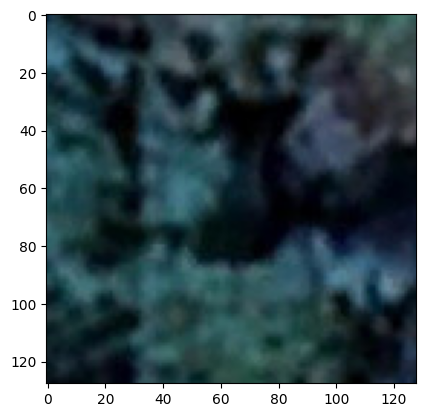

In [15]:
import matplotlib.pyplot as plt
from skimage.io import imread

# Load and display one of the chopped images from the hijau_chopped directory
chopped_image_path = "/content/action_dataset/hijau_chopped/hijau1_00000.png"  # Example path, adjust accordingly
image = imread(chopped_image_path)

# Display the image
plt.imshow(image)
plt.show()

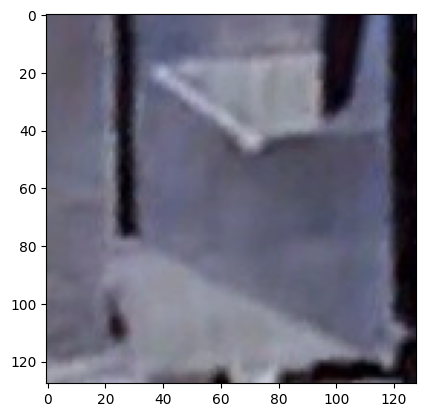

In [16]:
import matplotlib.pyplot as plt
from skimage.io import imread

# Load and display one of the chopped images from the hijau_chopped directory
chopped_image_path = "/content/action_dataset/bukan_hijau_chopped/bukan_hijau1_00000.png"  # Example path, adjust accordingly
image = imread(chopped_image_path)

# Display the image
plt.imshow(image)
plt.show()

In [17]:
from sklearn.model_selection import train_test_split

train_x, valid_x, train_y, valid_y = train_test_split(x,y,test_size=0.2,stratify = y)

print(train_x.shape)
print(train_y.shape)
print(valid_x.shape)
print(valid_y.shape)

(56, 49152)
(56,)
(14, 49152)
(14,)


In [18]:
#compute class weight
print(np.unique(train_y,return_counts=True))
print(np.unique(valid_y,return_counts=True))

cw = compute_class_weight(class_weight='balanced', classes=np.unique(train_y), y=train_y)
df_cw = pd.DataFrame(data=cw, columns=["cw"])
print(cw)

(array([0, 1]), array([24, 32]))
(array([0, 1]), array([6, 8]))
[1.16666667 0.875     ]


# Model Training and Evaluation

## Basic CNN Model

In [19]:
model = Sequential([
    layers.Conv2D(16,(3,3),name="conv1",input_shape=(128,128,3),activation="relu",padding="same"),
    layers.MaxPool2D((2,2),name="pool1"),
    layers.Dropout(0.2),
    layers.Conv2D(32,(3,3),name="conv2",padding="same"),
    layers.Activation("relu"),
    layers.MaxPool2D((2,2),name="pool2"),
    layers.Dropout(0.2),
    layers.Conv2D(32,(3,3),name="conv3",padding="same"),
    layers.Activation("relu"),
    layers.MaxPool2D((2,2),name="pool3"),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(64,activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1),
    layers.Activation("sigmoid",name="prediction")
]
)

model.compile(optimizer="adam",loss="binary_crossentropy",metrics=["acc"])

model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                       │ (None, 128, 128, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool1 (MaxPooling2D)                 │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 64, 64, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool2 (MaxPooling2D)                 │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 32, 32, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool3 (MaxPooling2D)                 │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │         524,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ prediction (Activation)              │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 538,753 (2.06 MB)

 Trainable params: 538,753 (2.06 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
train_x = train_x.reshape(train_x.shape[0],128,128,3)
valid_x = valid_x.reshape(valid_x.shape[0],128,128,3)

In [21]:
history = model.fit(train_x,train_y,epochs=25,validation_data=(valid_x,valid_y),class_weight=df_cw)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 880ms/step - acc: 0.5208 - loss: 0.8488 - val_acc: 0.4286 - val_loss: 0.6775
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 794ms/step - acc: 0.5551 - loss: 0.7485 - val_acc: 0.5714 - val_loss: 0.7003
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 467ms/step - acc: 0.4568 - loss: 0.7445 - val_acc: 0.4286 - val_loss: 0.6773
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 468ms/step - acc: 0.4301 - loss: 0.6621 - val_acc: 0.4286 - val_loss: 0.6714
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step - acc: 0.4315 - loss: 0.6680 - val_acc: 0.4286 - val_loss: 0.6699
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 453ms/step - acc: 0.4420 - loss: 0.6523 - val_acc: 0.4286 - val_loss: 0.6697
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step - acc: 0.4524 - loss: 0.6475 - val_acc: 0.4286 - val_loss: 0.6694
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step - acc: 0.4420 - loss: 0.6312 - val_acc: 0.5714 - val_loss: 0.6684
Epoch 9/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step - acc: 0.4330 - loss: 

In [22]:
# Save the entire model
model.save('/content/drive/MyDrive/Data/action_dataset/base_model.keras')

## **Transfer Learning**

In [23]:
# Define the input shape for the models
input_shape = (128, 128, 3)

# Base models
resnet_base = ResNet50(include_top=False, weights='imagenet', input_shape=input_shape)
inception_base = InceptionV3(include_top=False, weights='imagenet', input_shape=input_shape)
mobilenet_base = MobileNetV2(include_top=False, weights='imagenet', input_shape=input_shape)

# Freeze the base models
resnet_base.trainable = False
inception_base.trainable = False
mobilenet_base.trainable = False

# Function to create a new model using transfer learning
def create_transfer_model(base_model):
    model = Sequential([
        Input(shape=input_shape),            # Add Input layer to define input shape
        base_model,
        layers.GlobalAveragePooling2D(),     # Pool the features extracted by the base model
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(1, activation='sigmoid', name='prediction')  # Binary classification
    ])
    return model

# Create models for ResNet, Inception, and MobileNet
resnet_model = create_transfer_model(resnet_base)
inception_model = create_transfer_model(inception_base)
mobilenet_model = create_transfer_model(mobilenet_base)

# Compile each model
resnet_model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["acc"])
inception_model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["acc"])
mobilenet_model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["acc"])

# Print model summaries
print("ResNet50 Model Summary")
resnet_model.summary()

print("InceptionV3 Model Summary")
inception_model.summary()

print("MobileNetV2 Model Summary")
mobilenet_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
ResNet50 Model Summary


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 4, 4, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ prediction (Dense)                   │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

InceptionV3 Model Summary


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)            │ (None, 2, 2, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ prediction (Dense)                   │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,065,185 (84.17 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

MobileNetV2 Model Summary


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ prediction (Dense)                   │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

### Resnet Model

In [24]:
# Example training with ResNet model (do the same for other models)
history_resnet = resnet_model.fit(train_x, train_y, epochs=25, validation_data=(valid_x, valid_y), class_weight=df_cw)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - acc: 0.5208 - loss: 0.7118 - val_acc: 0.5714 - val_loss: 0.6742
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - acc: 0.5446 - loss: 0.6799 - val_acc: 0.5714 - val_loss: 0.6797
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 3s/step - acc: 0.5580 - loss: 0.7176 - val_acc: 0.5714 - val_loss: 0.6470
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 5s/step - acc: 0.6042 - loss: 0.6398 - val_acc: 0.6429 - val_loss: 0.6132
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - acc: 0.6161 - loss: 0.6768 - val_acc: 0.7143 - val_loss: 0.5944
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - acc: 0.8155 - loss: 0.5710 - val_acc: 0.7857 - val_loss: 0.5802
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 3s/step - acc: 0.6815 - loss: 0.5980 - val_acc: 0.7857 - val_loss: 0.5631
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 3s/step - acc: 0.8408 - loss: 0.5466 - val_acc: 0.7857 - val_loss: 0.5457
Epoch 9/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 5s/step - acc: 0.7604 - loss: 0.5557 - val_acc: 0.7143 -

In [25]:
# Save the entire model
resnet_model.save_weights('/content/drive/MyDrive/Data/action_dataset/resnet_model.weights.h5')

### Inception Model

In [26]:
# You can also train the InceptionV3 and MobileNetV2 models similarly:
history_inception = inception_model.fit(train_x, train_y, epochs=25, validation_data=(valid_x, valid_y), class_weight=df_cw)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 17s 4s/step - acc: 0.4330 - loss: 1.7989 - val_acc: 0.7857 - val_loss: 0.6212
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - acc: 0.7708 - loss: 0.4349 - val_acc: 0.5000 - val_loss: 0.9953
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - acc: 0.7545 - loss: 0.5188 - val_acc: 0.9286 - val_loss: 0.1940
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - acc: 0.9658 - loss: 0.0607 - val_acc: 0.7143 - val_loss: 0.5741
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - acc: 0.9420 - loss: 0.1194 - val_acc: 0.7143 - val_loss: 0.8243
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - acc: 0.9315 - loss: 0.1395 - val_acc: 0.7143 - val_loss: 0.4481
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - acc: 1.0000 - loss: 0.0257 - val_acc: 0.8571 - val_loss: 0.1673
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - acc: 1.0000 - loss: 0.0292 - val_acc: 1.0000 - val_loss: 0.0894
Epoch 9/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - acc: 1.0000 - loss: 0.0161 - val_acc: 1.0000 -

In [27]:
# Save the entire model
inception_model.save('/content/drive/MyDrive/Data/action_dataset/inception_model.keras')

### Mobilenet Model

In [28]:
history_mobilenet = mobilenet_model.fit(train_x, train_y, epochs=25, validation_data=(valid_x, valid_y), class_weight=df_cw)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 4s/step - acc: 0.6057 - loss: 0.7134 - val_acc: 1.0000 - val_loss: 0.1731
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step - acc: 0.9777 - loss: 0.1672 - val_acc: 1.0000 - val_loss: 0.0616
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 475ms/step - acc: 0.9881 - loss: 0.0460 - val_acc: 1.0000 - val_loss: 0.0300
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 493ms/step - acc: 1.0000 - loss: 0.0209 - val_acc: 1.0000 - val_loss: 0.0121
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 472ms/step - acc: 1.0000 - loss: 0.0074 - val_acc: 1.0000 - val_loss: 0.0048
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 489ms/step - acc: 1.0000 - loss: 0.0063 - val_acc: 1.0000 - val_loss: 0.0024
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step - acc: 1.0000 - loss: 0.0017 - val_acc: 1.0000 - val_loss: 0.0014
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step - acc: 1.0000 - loss: 0.0010 - val_acc: 1.0000 - val_loss: 0.0010
Epoch 9/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step - acc: 1.0000 - loss: 0.

In [29]:
# Save the entire model
mobilenet_model.save('/content/drive/MyDrive/Data/action_dataset/mobilenet_model.keras')

# Evaluate Model With Data Test

In [30]:
#read test data
img_path = "/content/test_images3.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.4)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

In [31]:
# List of models and their names
models = [
    (model, 'Basic_CNN'),
    (resnet_model, 'ResNet50'),
    (inception_model, 'InceptionV3'),
    (mobilenet_model, 'MobileNetV2')
]

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 286ms/step


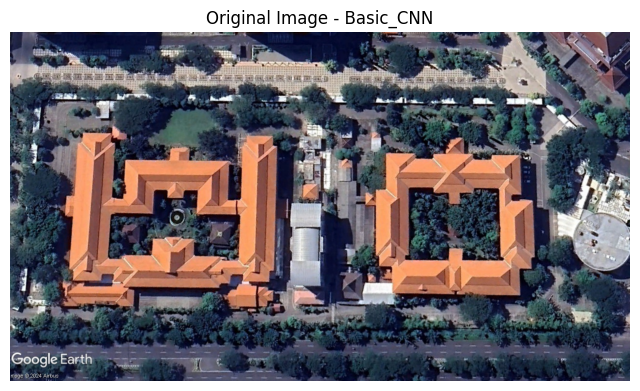

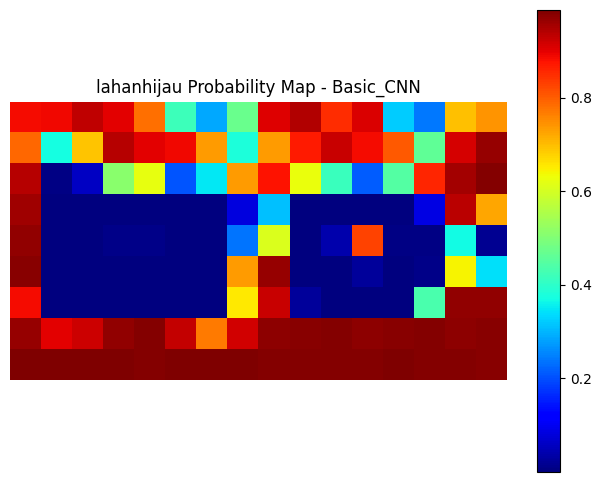

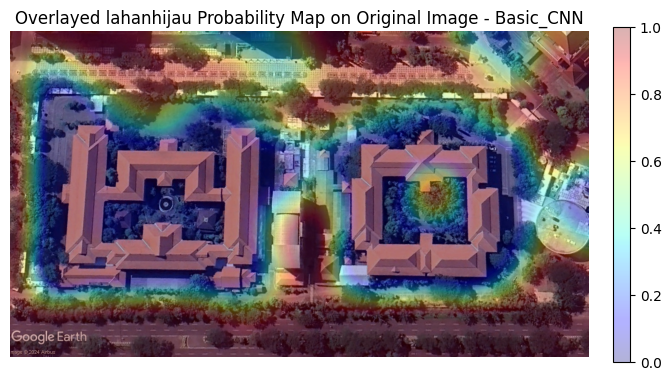

Explanation for Basic_CNN plots:
1. The first plot shows the original image.
2. The second plot displays the lahanhijau probability map predicted by Basic_CNN. Warmer colors indicate higher probabilities of lahanhijau presence.
3. The third plot overlays the probability map onto the original image, highlighting areas where Basic_CNN predicts lahanhijau.


5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step


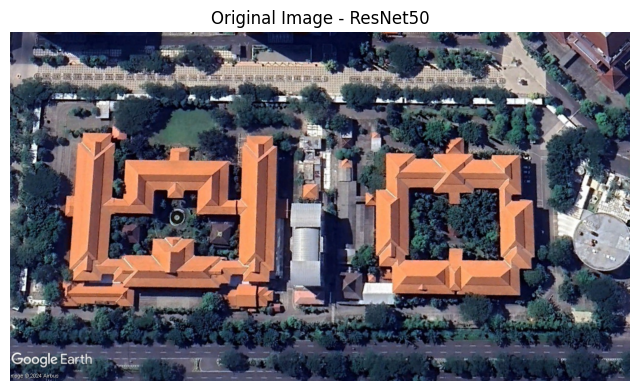

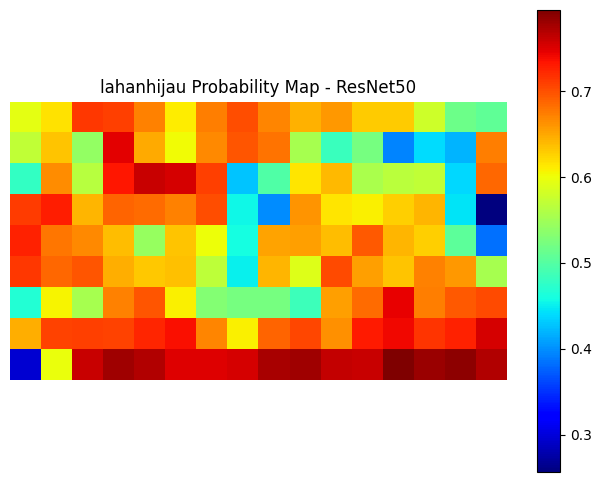

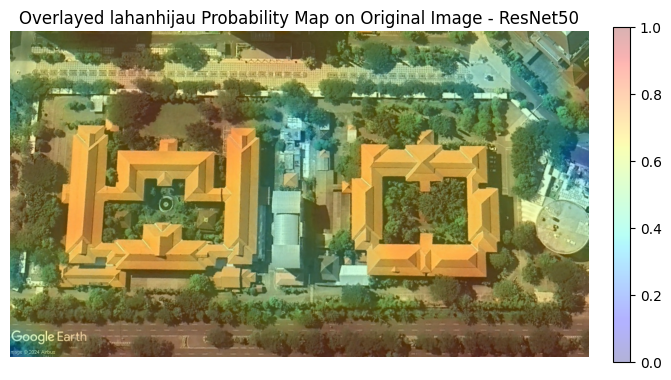

Explanation for ResNet50 plots:
1. The first plot shows the original image.
2. The second plot displays the lahanhijau probability map predicted by ResNet50. Warmer colors indicate higher probabilities of lahanhijau presence.
3. The third plot overlays the probability map onto the original image, highlighting areas where ResNet50 predicts lahanhijau.




4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 960ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step


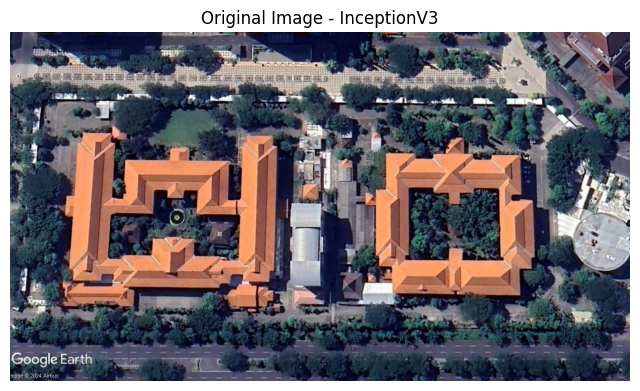

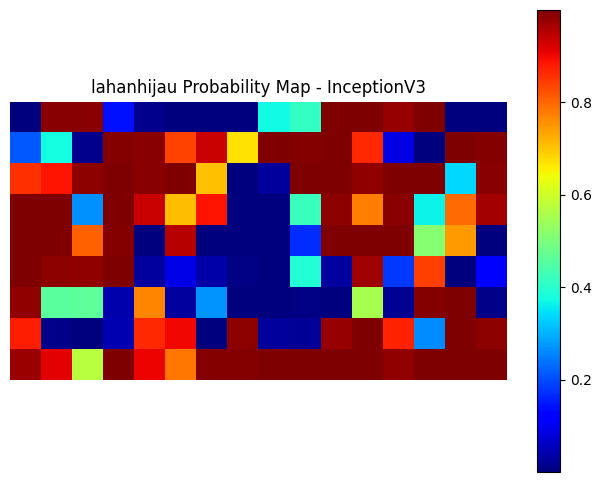

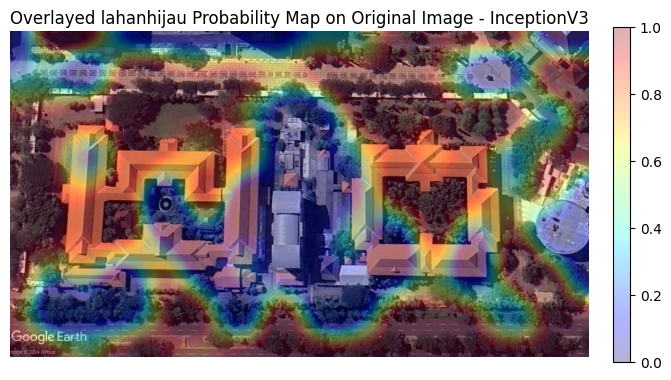

Explanation for InceptionV3 plots:
1. The first plot shows the original image.
2. The second plot displays the lahanhijau probability map predicted by InceptionV3. Warmer colors indicate higher probabilities of lahanhijau presence.
3. The third plot overlays the probability map onto the original image, highlighting areas where InceptionV3 predicts lahanhijau.


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step


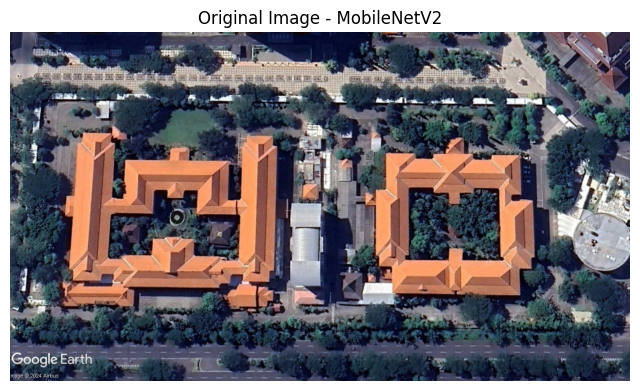

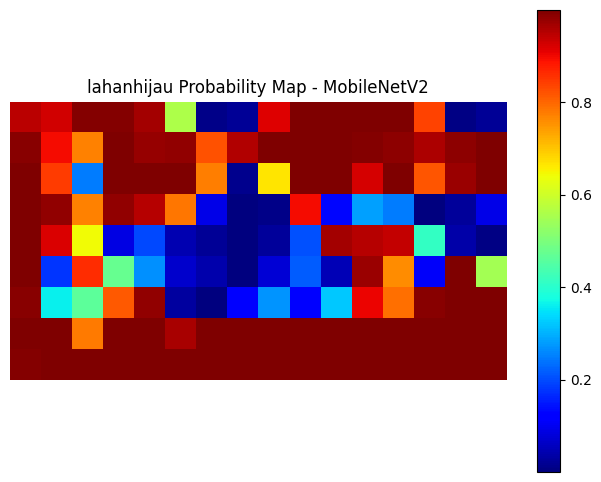

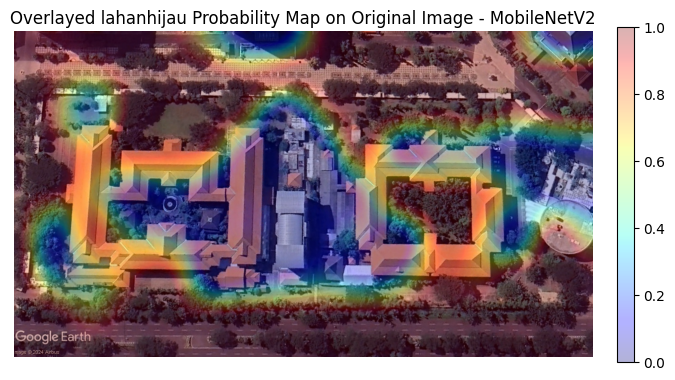

Explanation for MobileNetV2 plots:
1. The first plot shows the original image.
2. The second plot displays the lahanhijau probability map predicted by MobileNetV2. Warmer colors indicate higher probabilities of lahanhijau presence.
3. The third plot overlays the probability map onto the original image, highlighting areas where MobileNetV2 predicts lahanhijau.




In [32]:
# Function to process predictions and plot results for each model
def process_and_plot(model, model_name):
    # Predict the lahanhijau probability for all the cropped images
    predictions = model.predict(patches)

    # Reshape back to its original form
    lahanhijau = np.reshape(predictions, (n_total // n_x, n_x))
    lahanhijau = np.rot90(lahanhijau)
    lahanhijau = np.flip(lahanhijau, axis=0)

    h_factor = img.shape[0] // lahanhijau.shape[0]
    w_factor = img.shape[1] // lahanhijau.shape[1]

    zoomed = zoom(lahanhijau, (h_factor, w_factor))

    # Plotting results
    plt.figure(figsize=(8,6))
    plt.title(f'Original Image - {model_name}')
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8,6))
    plt.title(f'lahanhijau Probability Map - {model_name}')
    plt.imshow(lahanhijau, cmap='jet')
    plt.colorbar()
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8,6))
    plt.title(f'Overlayed lahanhijau Probability Map on Original Image - {model_name}')
    plt.imshow(img)
    plt.imshow(zoomed, alpha=0.3, vmax=1.0, vmin=0, cmap='jet')
    plt.colorbar(fraction=0.027, pad=0.04)
    plt.axis('off')
    plt.show()

    # Explanations
    print(f'Explanation for {model_name} plots:')
    print(f'1. The first plot shows the original image.')
    print(f'2. The second plot displays the lahanhijau probability map predicted by {model_name}. Warmer colors indicate higher probabilities of lahanhijau presence.')
    print(f'3. The third plot overlays the probability map onto the original image, highlighting areas where {model_name} predicts lahanhijau.')

    # Add separator between models
    print("\n" + "="*80 + "\n")

# Loop through each model and process
for model, model_name in models:
    process_and_plot(model, model_name)

# Mengukur Luas Lahan Hijau di Setiap Fakultas Kampus C UNAIR

##rektorat dan forkom

In [156]:
#read test data
img_path = "/content/rektorat_forkom_.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 470ms/step


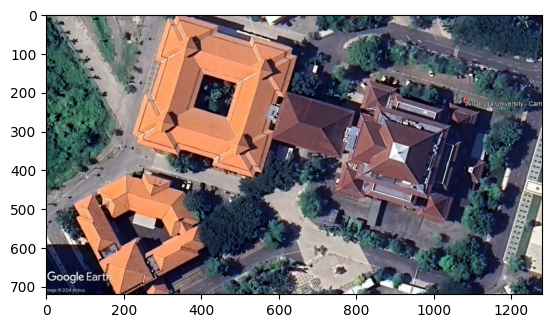

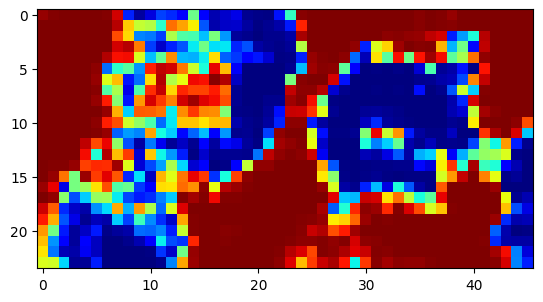

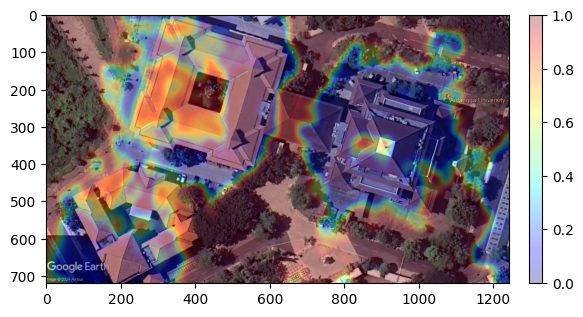

In [157]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

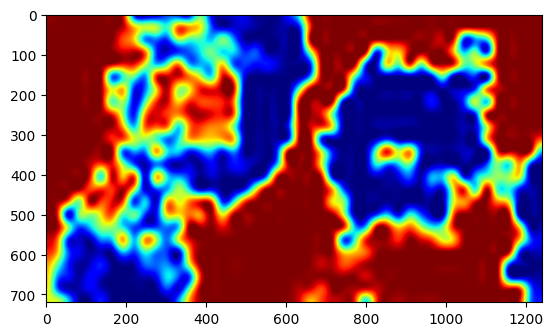

In [158]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [159]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [160]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 515935


In [161]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 15478.05
Luas lahan hijau dalam hektar : 1.5478049999999999


##fst

In [162]:
#read test data
img_path = "/content/fst_.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 465ms/step


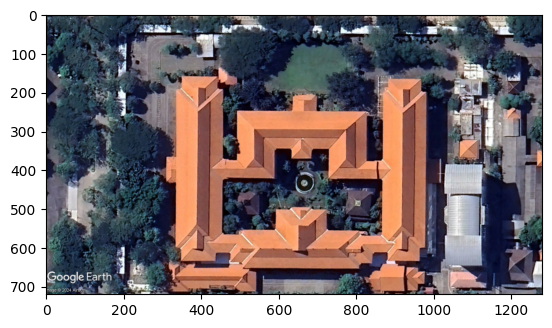

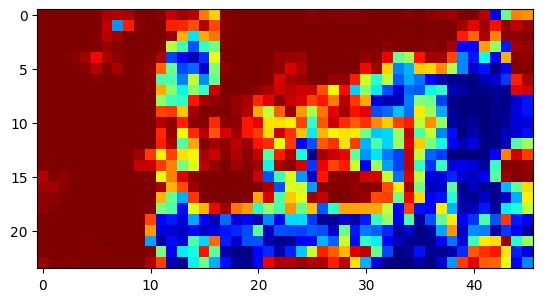

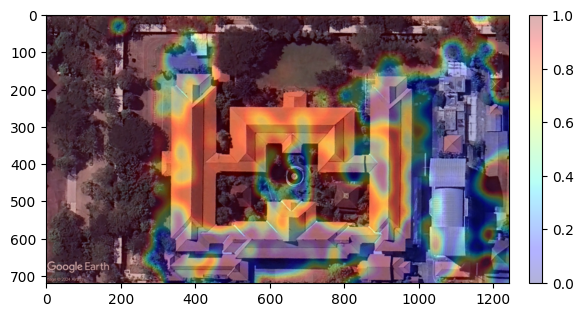

In [163]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

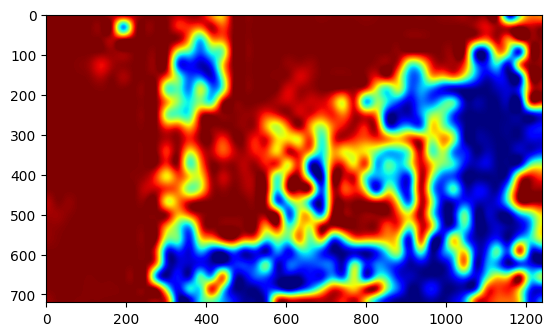

In [164]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [165]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [166]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 601972


In [167]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 18059.16
Luas lahan hijau dalam hektar : 1.805916


##ACC

In [168]:
#read test data
img_path = "/content/acc_.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 469ms/step


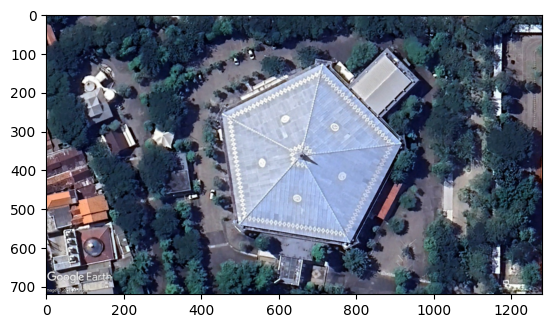

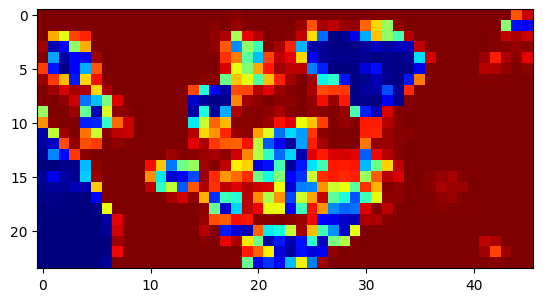

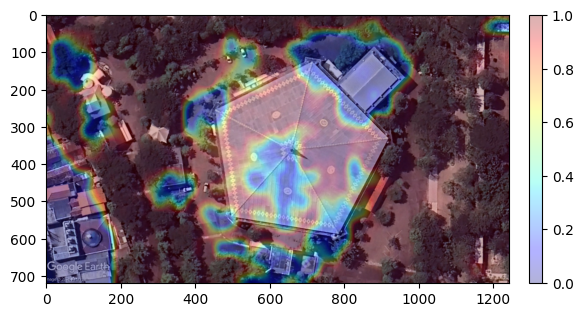

In [169]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

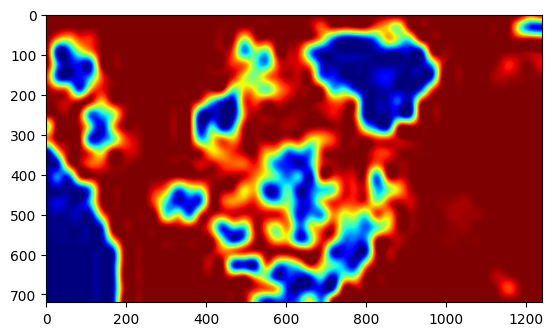

In [170]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [171]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [172]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 695444


In [173]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 20863.32
Luas lahan hijau dalam hektar : 2.086332


##nano_nani

In [174]:
#read test data
img_path = "/content/nano_nani_.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 478ms/step


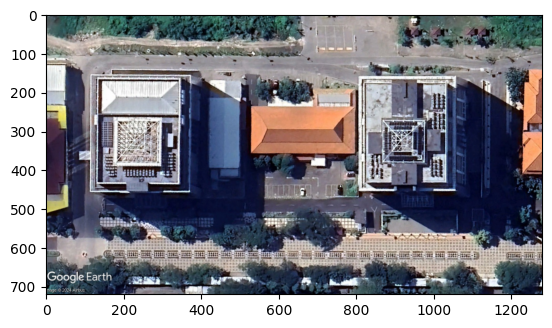

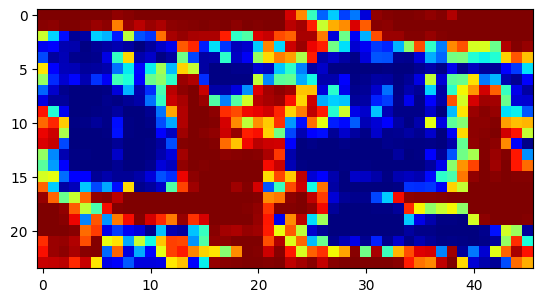

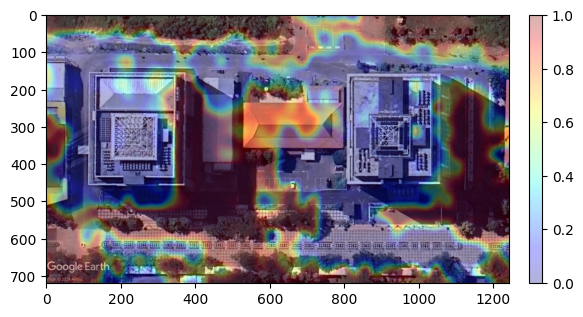

In [175]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

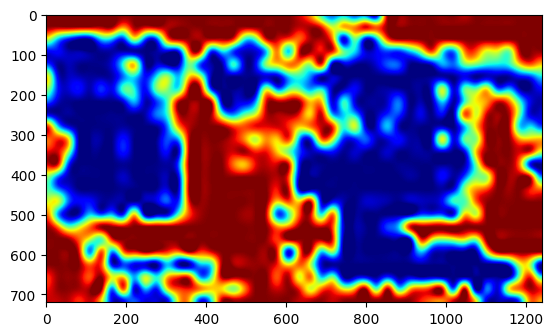

In [176]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [177]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [178]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 449167


In [179]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 13475.01
Luas lahan hijau dalam hektar : 1.347501


##fkm ulaz

In [180]:
#read test data
img_path = "/content/fkm_ulaz_.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 462ms/step


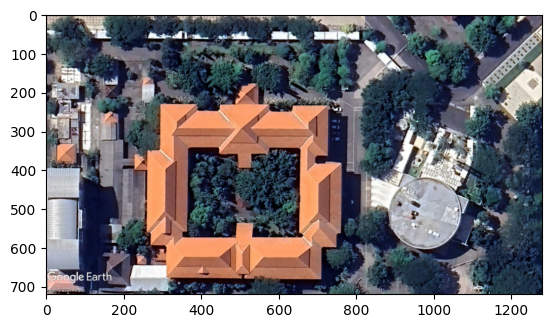

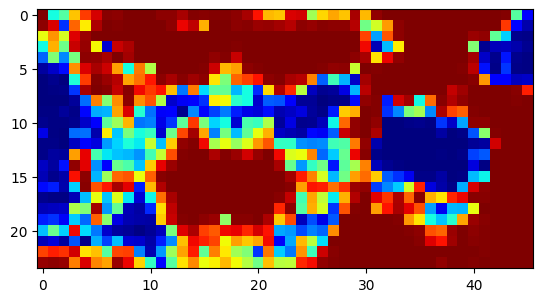

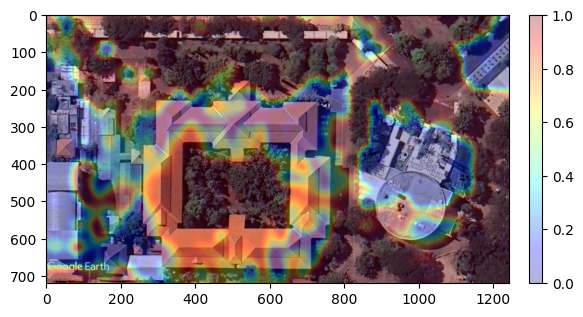

In [181]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

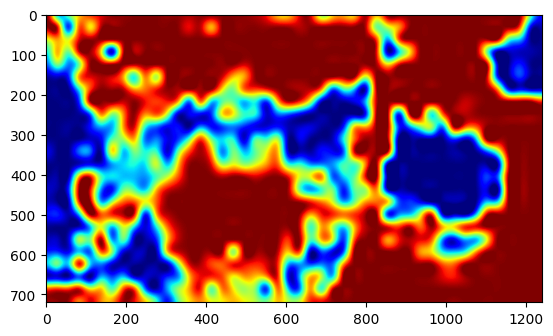

In [182]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [183]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [184]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 586153


In [185]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 17584.59
Luas lahan hijau dalam hektar : 1.758459


##RS Hewan

In [186]:
#read test data
img_path = "/content/rs_hewan.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 465ms/step


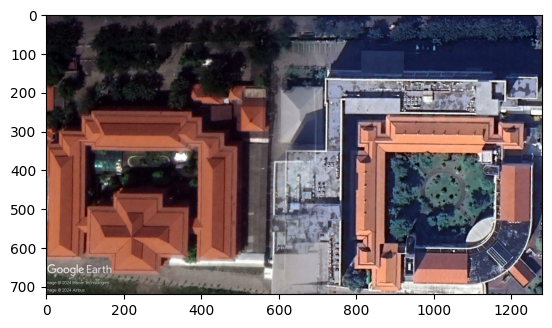

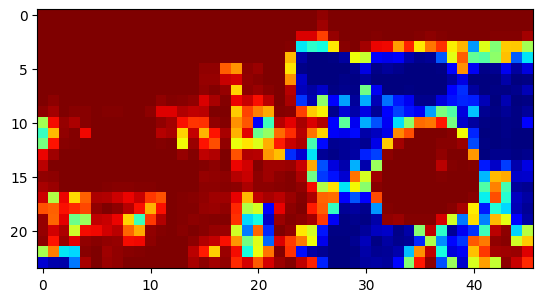

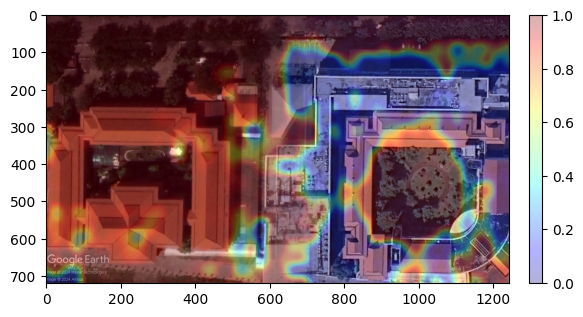

In [187]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

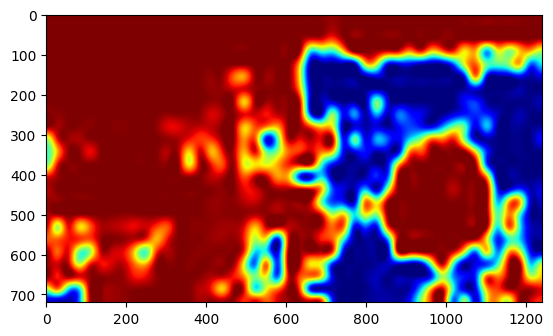

In [188]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [189]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [190]:
print("Luas lahan hijaudalam piksel :", (luaspiksel))

Luas lahan hijaudalam piksel : 639048


In [191]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 19171.44
Luas lahan hijau dalam hektar : 1.917144


##perpus eatery

In [192]:
#read test data
img_path = "/content/perpus_eatery_lapangan.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step


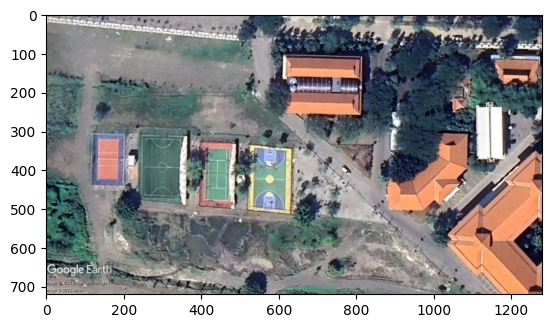

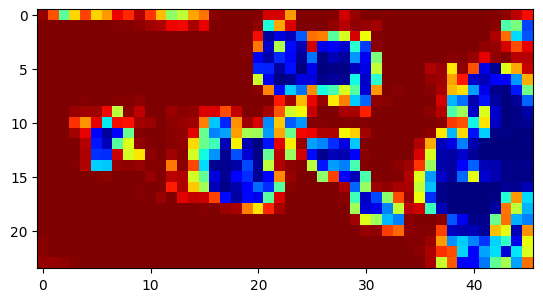

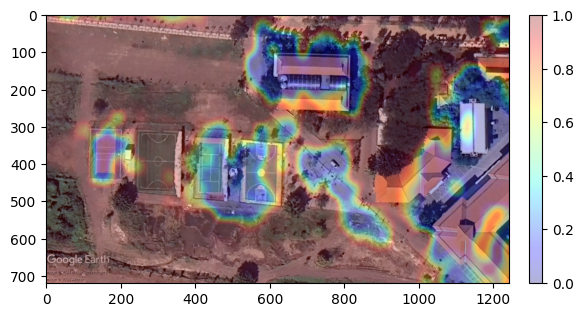

In [193]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

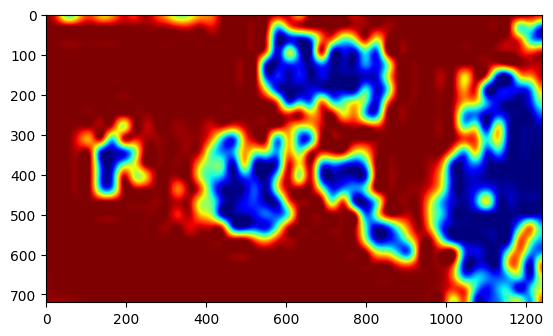

In [194]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [195]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [196]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 660710


In [197]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 19821.3
Luas lahan hijau dalam hektar : 1.98213


##fpk astra

In [198]:
#read test data
img_path = "/content/fpk_astra.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 468ms/step


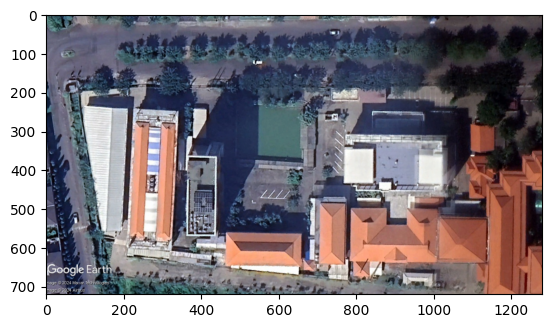

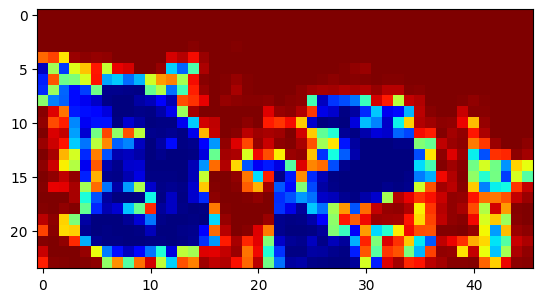

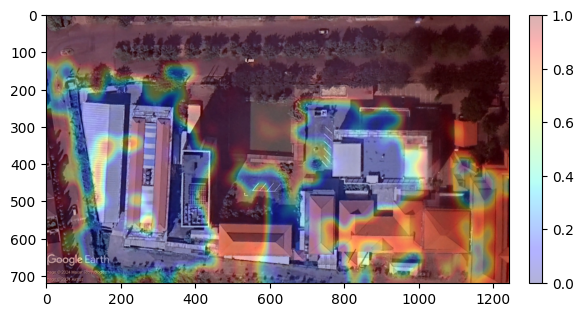

In [199]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

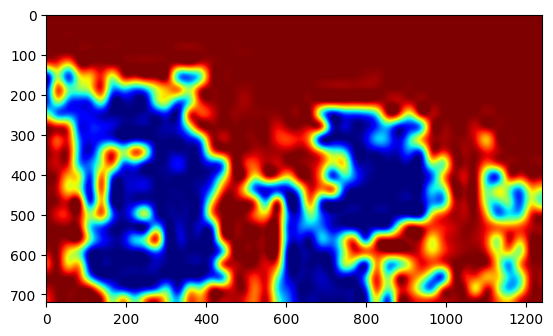

In [200]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [201]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [202]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 596716


In [203]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 17901.48
Luas lahan hijau dalam hektar : 1.7901479999999999


##rs unair dan keperawatan

In [204]:
#read test data
img_path = "/content/rs_keperawatan.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 462ms/step


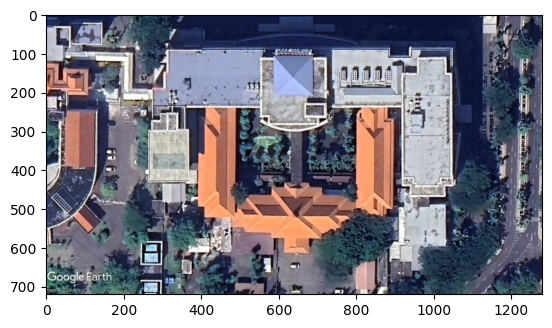

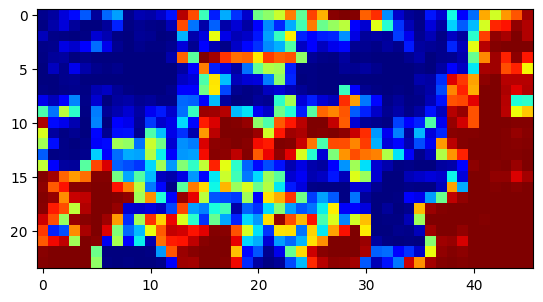

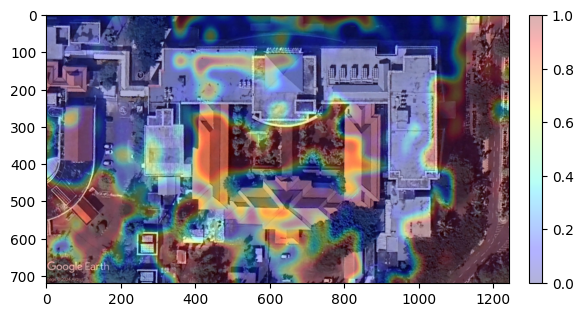

In [205]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

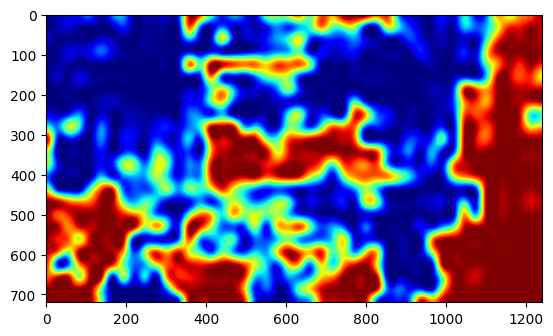

In [206]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [207]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [208]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 354452


In [209]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 10633.56
Luas lahan hijau dalam hektar : 1.063356


##astri

In [210]:
#read test data
img_path = "/content/astri.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 474ms/step


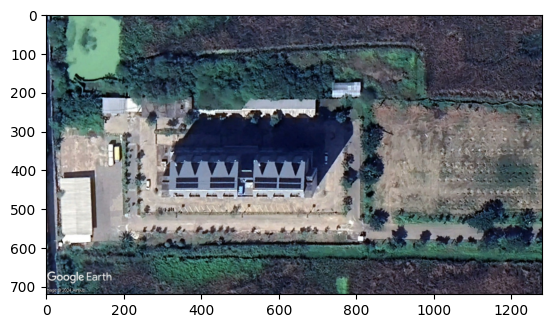

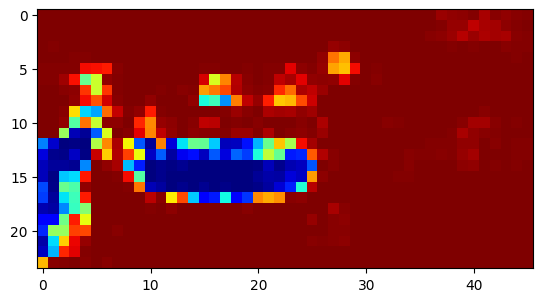

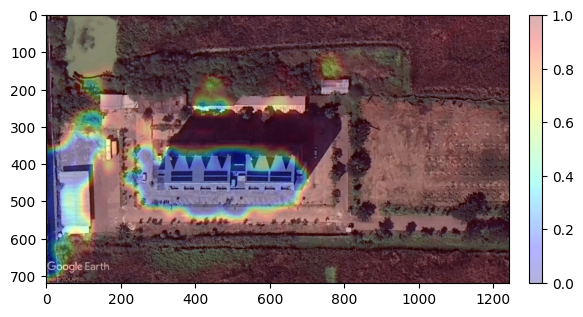

In [211]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

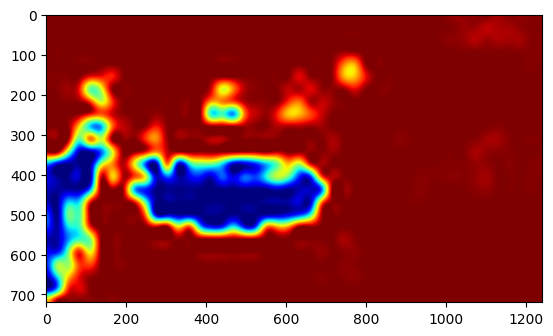

In [212]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [213]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [214]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 791767


In [215]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 23753.01
Luas lahan hijau dalam hektar : 2.375301


##lahan gedung parkir

In [216]:
#read test data
img_path = "/content/lahan_gedung_parkir.jpg"
img = load_img(img_path)
img = img_to_array(img)/255

#create subimages
patches = []
windows = sw.generate(img, sw.DimOrder.HeightWidthChannel, 128, 0.8)
for i,window in enumerate(windows):
    _img = img[window.indices()]
    patches.append(_img)
patches = np.array(patches)

#check total images, how many images are tiled at height direction, and width direction
n_total = len(windows)
_x = 0
for i,window in enumerate(windows):
    if _x != window.x:
        n_x = i
        break
    _x = window.x

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 475ms/step


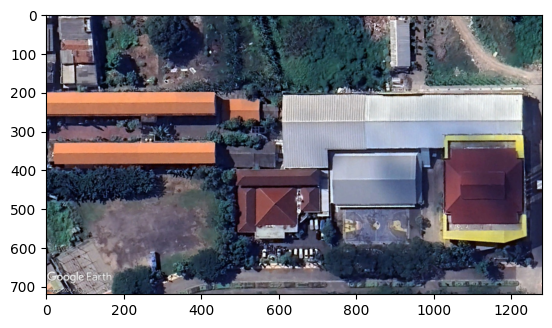

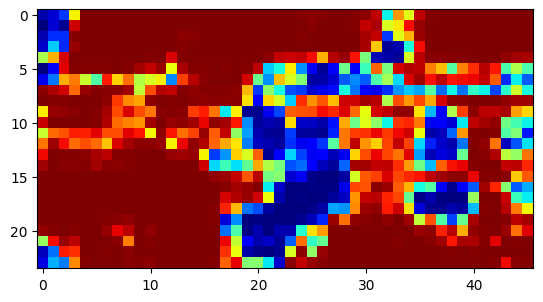

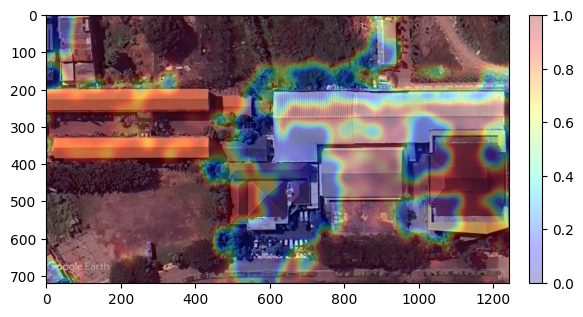

In [217]:
#predict the lahanhijau probability for all the cropped images, and reshape back to its original form.
predictions = model.predict(patches)
lahanhijau = np.reshape(predictions,(n_total//n_x,n_x))
lahanhijau = np.rot90(lahanhijau)
lahanhijau = np.flip(lahanhijau,axis=0)

h_factor = img.shape[0]//lahanhijau.shape[0]
w_factor = img.shape[1]//lahanhijau.shape[1]

from scipy.ndimage import zoom
zoomed = zoom(lahanhijau,(h_factor,w_factor))

#result
plt.imshow(img)
plt.show()

plt.imshow(lahanhijau,cmap="jet")
plt.show()

plt.imshow(img)
plt.imshow(zoomed,alpha=0.3,vmax=1.0,vmin=0,cmap="jet")

plt.colorbar(fraction=0.027, pad=0.04,alpha=0)
plt.show()

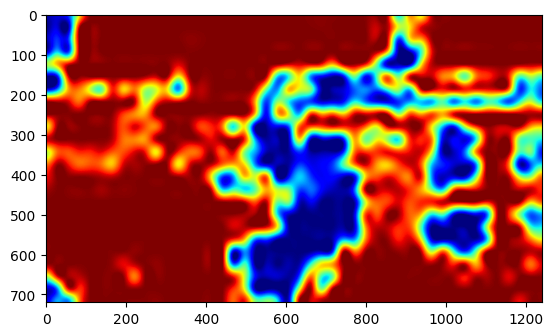

In [218]:
plt.imshow(zoomed,alpha=1,vmax=1.0,vmin=0,cmap="jet")

In [219]:
normalized = (zoomed-np.min(zoomed))/(np.max(zoomed)-np.min(zoomed))
luaspiksel=(normalized>0.5).sum()
akurasi=((normalized>0.5).sum()*100/(normalized<1).sum())

In [220]:
print("Luas lahan hijau dalam piksel :", (luaspiksel))

Luas lahan hijau dalam piksel : 695737


In [221]:
luasmtr = 0.03*(luaspiksel)
luasha = (luasmtr)/10000
print("Luas lahan hijau dalam meter persegi :", (luasmtr))
print("Luas lahan hijau dalam hektar :", (luasha))

Luas lahan hijau dalam meter persegi : 20872.11
Luas lahan hijau dalam hektar : 2.087211
